# Proyek Analisis Data: E-Commerce Public Dataset
- **Nama:** Muhammad Adib
- **Email:** adibjr23@gmail.com
- **ID Dicoding:** muhammadadibjr23

## Menentukan Pertanyaan Bisnis

- Bagaimana demografi pelanggan berdasarkan kota dan negara bagian?
- Bagaimana kinerja penjualan atau pendapatan dalam beberapa bulan terakhir?
- Apa katagori produk yang paling banyak dan paling sedikit terjual?

## Import Semua Packages/Library yang Digunakan

Untuk mempermudah proses perhitungan matematis dan analisis statistik deskriptif atau analisis data secara umum, saya akan menggunakan library Pandas dan Numpy. Sedangkan untuk visualisasi data, saya menggunakan kombinasi dari library Matplotlib dan Seaborn. Adapun Streamlit adalah library yang akan digunakan untuk pembuatan dashboard sederhana sebagai proses akhir dalam proyek Analisis Data dengan Python ini

In [1]:
# Menghubungkan Google Drive ke Google Colab

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# Alias ke folder "submission" untuk dapat bekerja seolah-olah berada di folder tersebut tanpa perlu menuliskan path yang panjang

%cd /content/drive/My Drive/submission

/content/drive/My Drive/submission


In [3]:
!pip install pandas numpy matplotlib seaborn

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Data Wrangling

### Gathering Data

#### Memuat Data Customers

In [5]:
customers_dataset_df = pd.read_csv("data/customers_dataset.csv")

In [6]:
customers_dataset_df.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


#### Memuat Data Orders

In [7]:
orders_dataset_df = pd.read_csv("data/orders_dataset.csv")

In [8]:
orders_dataset_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


#### Memuat Data Order Items

In [9]:
order_items_dataset_df = pd.read_csv("data/order_items_dataset.csv")

In [10]:
order_items_dataset_df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


#### Memuat Data Order Payments

In [11]:
order_payments_dataset_df = pd.read_csv("data/order_payments_dataset.csv")

In [12]:
order_payments_dataset_df.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


#### Memuat Data Order Reviews

In [13]:
order_reviews_dataset_df = pd.read_csv("data/order_reviews_dataset.csv")

In [14]:
order_reviews_dataset_df.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


#### Memuat Data Products

In [15]:
products_dataset_df = pd.read_csv("data/products_dataset.csv")

In [16]:
products_dataset_df.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


#### Memuat Data Product Category Name Translation

In [17]:
product_category_name_translation_df = pd.read_csv("data/product_category_name_translation.csv")

In [18]:
product_category_name_translation_df.head()

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


#### Memuat Data Sellers

In [19]:
sellers_dataset_df = pd.read_csv("data/sellers_dataset.csv")

In [20]:
sellers_dataset_df.head()

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


#### Memuat Data Geolocation

In [21]:
geolocation_dataset_df = pd.read_csv("data/geolocation_dataset.csv")

In [22]:
geolocation_dataset_df.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


#### Insight
- Dataset "customers_dataset.csv" memuat informasi tentang pelanggan meliputi ID pelanggan (customer_id), ID unik pelanggan (customer_unique_id), kode pos pelanggan (customer_zip_code_prefix), kota pelanggan (customer_city) dan negara bagian pelanggan (customer_state).
- Dataset "orders_dataset.csv" memuat informasi tentang data pesanan meliputi ID pesanan (order_id), ID pelanggan (customer_id), status pesanan (order_status), tanggal dan waktu ketika pelanggan menyelesaikan pembelian atau checkout di platform (order_purchase_timestamp), tanggal dan waktu ketika pembayaran untuk pesanan disetujui (order_approved_at), tanggal dan waktu ketika pesanan diserahkan oleh penjual ke pihak kurir atau jasa pengiriman (order_delivered_carrier_date), tanggal dan waktu ketika pesanan berhasil diterima oleh pelanggan (order_delivered_customer_date) dan tanggal yang diperkirakan sebagai batas waktu pengiriman pesanan kepada pelanggan (order_estimated_delivery_date).
- Dataset "order_items_dataset.csv" memuat informasi tentang detail item pesanan meliputi ID pesanan (order_id), ID unik untuk setiap item dalam pesanan (order_item_id), ID unik untuk produk yang dibeli dalam pesanan (product_id), ID penjual (seller_id), tanggal dan waktu batas akhir penjual untuk menyerahkan barang ke jasa pengiriman (shipping_limit_date), harga barang (price) dan biaya pengiriman atau ongkir (freight_value).
- Dataset "order_payments_dataset.csv" memuat informasi tentang pembayaran pesanan meliputi ID pesanan (order_id), urutan pembayaran dalam suatu pesanan (payment_sequential), jenis atau metode pembayaran (payment_type), jumlah total cicilan pembayaran yang dipilih oleh pelanggan untuk suatu pesanan (payment_installments) dan jumlah uang yang dibayarkan dalam transaksi pembayaran tertentu (payment_value).
- Dataset "order_reviews_dataset.csv" memuat informasi tentang ID ulasan (review_id), ID pesanan (order_id), skor ulasan (review_score), judul komentar ulasan (review_comment_title), pesan komentar ulasan (review_comment_message), tanggal dan waktu ulasan dibuat (review_creation_date) dan tanggal dan waktu ulasan dijawab (review_answer_timestamp).
- Dataset "products_dataset.csv" memuat informasi tentang produk meliputi ID produk (product_id), nama katagori produk (product_category_name), panjang nama produk (product_name_lenght), panjang deskripsi produk (product_description_lenght), jumlah foto produk (product_photos_qty), berat produk dalam satuan gram (product_weight_g), panjang produk dalam satuan sentimeter (product_length_cm), tinggi produk dalam satuan sentimeter (product_height_cm) dan lebar produk dalam satuan sentimeter (product_width_cm).
- Dataset "product_category_name_translation.csv" memuat informasi tentang nama katagori produk dalam bahasa asli yaitu portugis (product_category_name) dan nama katagori produk dalam bahasa Inggris (product_category_name_english).
- Dataset "sellers_dataset.csv" memuat informasi tentang penjual meliputi ID penjual (seller_id), kode pos penjual (seller_zip_code_prefix), kota penjual (seller_city) dan negara bagian penjual (seller_state).
- Dataset "geolocation_dataset.csv" memuat informasi tentang data geo-lokasi meliputi kode pos geo-lokasi (geolocation_zip_code_prefix), garis lintang atau latitude (geolocation_lat), garis bujur atau longitude (geolocation_lng), kota geo-lokasi (geolocation_city) dan negara bagian geo-lokasi (geolocation_city).

### Assessing Data

#### Menilai Data Customers

In [23]:
customers_dataset_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


**Insight:**

Berdasarkan hasil pemeriksaan informasi dataset dengan menggunakan method `info()` di atas, tidak terdapat masalah apapun dari sisi tipe data dan jumlah data dari setiap kolom tersebut. Diketahui bahwa jumlah data seharusnya dari setiap kolom dalam dataset tersebut adalah 99.441. Semua kolom dalam dataset tersebut sudah berjumlah 99.441 yang menandakan bahwa tidak ada missing value dalam dataset tersebut. Adapun pemilihan tipe data yang digunakan dari masing-masing kolom juga sudah tepat. Kolom "customer_id" dan "customer_unique_id" tidak menggunakan tipe data integer karena keduanya berisi kombinasi antara huruf dan angka sehingga tipe data yang dipilih adalah string atau object.

Untuk memastikan apakah benar-benar tidak ada missing value dalam dataset tersebut, saya akan menjalankan kode berikut.

In [24]:
customers_dataset_df.isna().sum()

,0
customer_id,0
customer_unique_id,0
customer_zip_code_prefix,0
customer_city,0
customer_state,0


**Insight:**
Berdasarkan hasil pemeriksaan missing value menggunakan metodh `isna()` yang dikombinasikan dengan `sum()` di atas, maka dapat dipastikan tidak ada missing value dalam dataset tersebut.

Kemudian, masalah berikutnya yang harus diperiksa adalah duplikasi data. Untuk memeriksa hal tersebut, saya akan menjalankan kode berikut.

In [25]:
print("Jumlah duplikasi: ", customers_dataset_df.duplicated().sum())

Jumlah duplikasi:  0


**Insight:** Berdasarkan hasil pemeriksaan duplikasi data menggunakan metodh `duplicated()` yang dikombinasikan dengan `sum()` di atas, tidak terdapat duplikasi data dalam dataset tersebut.

Lalu, langkah terakhir dalam assesing data yang dapat dilakukan untuk dataset ini adalah memeriksa ringkasan parameter statistik dari kolom numerik pada dataset tersebut. Untuk itu, saya akan menjalankan kode berikut.

In [26]:
customers_dataset_df.describe()

,customer_zip_code_prefix
count,99441.000000
mean,35137.474583
std,29797.938996
min,1003.000000
25%,11347.000000
50%,24416.000000
75%,58900.000000
max,99990.000000


Karena tidak terdapat poin yang dapat diambil dari ringkasan parameter statistik di atas karena kolom yang dianalisis hanyalah kolom yang memuat informasi tentang kode pos pelanggan, maka langkah ini pada dasarnya tidak memberikan insight apapun dalam kasus ini.

#### Menilai Data Orders

In [27]:
orders_dataset_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


**Insight:**

Berdasarkan hasil pemeriksaan informasi dataset dengan menggunakan method `info()` di atas, terdapat masalah pada jumlah data dan tipe data yang dipilih pada kolom "order_purchase_timestamp", "order_approved_at", "order_delivered_carrier_date", "order_delivered_customer_date" dan "order_estimated_delivery_date". Diketahui bahwa jumlah data seharusnya dari setiap kolom dalam dataset tersebut adalah 99.441. Pada kolom "order_approved_at", "order_delivered_carrier_date" dan "order_delivered_customer_date" terdapat perbedaan jumlah data dari jumlah yang seharusnya. Hal ini menandakan adanya missing value pada kolom-kolom tersebut. Kemudian terdapat juga masalah tipe data pada kolom-kolom data yang telah disebutkan sebelumnya. Kolom-kolom tersebut seharusnya direpresentasikan dengan tipe data "datetime", bukan tipe data "string" atau "object" karena data dalam kolom-kolom tersebut merupakan data yang terkait dengan waktu.

Selanjutnya, untuk memastikan adanya missing value dalam dataset tersebut, saya akan menjalankan kode berikut.

In [28]:
orders_dataset_df.isna().sum()

,0
order_id,0
customer_id,0
order_status,0
order_purchase_timestamp,0
order_approved_at,160
order_delivered_carrier_date,1783
order_delivered_customer_date,2965
order_estimated_delivery_date,0


**Insight:** Berdasarkan hasil pemeriksaan missing value menggunakan metodh `isna()` yang dikombinasikan dengan `sum()` di atas, dapat dipastikan adanya missing value pada kolom "order_approved_at" sebanyak 160 values, kolom "order_delivered_carrier_date" sebanyak 1783 values, dan kolom "order_delivered_customer_date" sebanyak 2965 values.

Kemudian, masalah berikutnya yang harus diperiksa adalah duplikasi data. Untuk memeriksa hal tersebut, saya akan menjalankan kode berikut.

In [29]:
print("Jumlah duplikasi: ",orders_dataset_df.duplicated().sum())

Jumlah duplikasi:  0


**Insight:** Berdasarkan hasil pemeriksaan duplikasi data menggunakan metodh `duplicated()` yang dikombinasikan dengan `sum()` di atas, tidak terdapat duplikasi data dalam dataset tersebut.

Lalu, langkah terakhir dalam assesing data yang dapat dilakukan untuk dataset ini adalah memeriksa ringkasan parameter statistik dari kolom numerik pada dataset tersebut. Untuk itu, saya akan menjalankan kode berikut.

In [30]:
orders_dataset_df.describe()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
count,99441,99441,99441,99441,99281,97658,96476,99441
unique,99441,99441,8,98875,90733,81018,95664,459
top,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2018-04-11 10:48:14,2018-02-27 04:31:10,2018-05-09 15:48:00,2018-05-08 23:38:46,2017-12-20 00:00:00
freq,1,1,96478,3,9,47,3,522


**Insight:** Berdasarkan hasil pemeriksaan ringkasan parameter statistik menggunakan metodh `describe()` di atas, tidak terdapat nilai yang aneh dalam dataset tersebut.

#### Menilai Data Order Items

In [31]:
order_items_dataset_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


**Insight:**

Berdasarkan hasil pemeriksaan informasi dataset dengan menggunakan method `info()` di atas, tidak terdapat masalah pada jumlah data dari setiap kolom karena semuanya sudah sesuai dengan jumlah data yang seharusnya yaitu 112.650, akan tetapi yang menjadi masalah adalah pemilihan tipe data yang tidak tepat pada kolom "shipping_limit_date". Kolom tersebut seharusnya memiliki tipe data "datetime" karena nilai-nilai di dalamnya berkaitan dengan waktu.

Sebelum ke langkah pemeriksaan selanjutnya, untuk betul-betul memastikan ketiadaan missing value pada dataset tersebut, saya akan menjalankan kode berikut.

In [32]:
order_items_dataset_df.isna().sum()

,0
order_id,0
order_item_id,0
product_id,0
seller_id,0
shipping_limit_date,0
price,0
freight_value,0


**Insight:** Berdasarkan hasil pemeriksaan missing value menggunakan metodh `isna()` yang dikombinasikan dengan `sum()` di atas, dapat dipastikan bahwa tidak ada missing value pada dataset tersebut.

Kemudian, masalah berikutnya yang harus diperiksa adalah duplikasi data. Untuk memeriksa hal tersebut, saya akan menjalankan kode berikut.

In [33]:
print("Jumlah duplikasi: ",order_items_dataset_df.duplicated().sum())

Jumlah duplikasi:  0


**Insight:** Berdasarkan hasil pemeriksaan duplikasi data menggunakan metodh `duplicated()` yang dikombinasikan dengan `sum()` di atas, tidak terdapat duplikasi data dalam dataset tersebut.

Lalu, langkah terakhir dalam assesing data yang dapat dilakukan untuk dataset ini adalah memeriksa ringkasan parameter statistik dari kolom numerik pada dataset tersebut. Untuk itu, saya akan menjalankan kode berikut.

In [34]:
order_items_dataset_df.describe()

,order_item_id,price,freight_value
count,112650.000000,112650.000000,112650.000000
mean,1.197834,120.653739,19.990320
std,0.705124,183.633928,15.806405
min,1.000000,0.850000,0.000000
25%,1.000000,39.900000,13.080000
50%,1.000000,74.990000,16.260000
75%,1.000000,134.900000,21.150000
max,21.000000,6735.000000,409.680000


**Insight:** Berdasarkan hasil pemeriksaan ringkasan parameter statistik menggunakan metodh `describe()` di atas, tidak terdapat nilai yang aneh dalam dataset tersebut.

#### Menilai Data Order Payments

In [35]:
order_payments_dataset_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


**Insight:**

Berdasarkan hasil pemeriksaan informasi dataset menggunakan method `info()` di atas, tidak terdapat masalah pada jumlah data dan tipe datanya. Diketahui bahwa jumlah data yang seharusnya untuk setiap kolom pada dataset di atas adalah 103.886. Semua kolom pada dataset tersebut memiliki jumlah data yang sama dengan jumlah data yang seharusnya sehingga dapat disimpulkan bahwa tidak ada missing value dalam dataset tersebut. Demikian juga dengan tipe data yang digunakan oleh masing-masing kolom, semuanya sudah sesuai dengan representasi nilainya masing-masing.

Namun, untuk memastikan bahwa betul-betul tidak ada missing value dalam dataset tersebut, saya akan menjalankan kode berikut.

In [36]:
order_payments_dataset_df.isna().sum()

,0
order_id,0
payment_sequential,0
payment_type,0
payment_installments,0
payment_value,0


**Insight:** Berdasarkan hasil pemeriksaan missing value menggunakan method `isna()` yang dikombinasikan dengan `sum()` di atas, dapat dipastikan bahwa tidak ada missing value dalam dataset tersebut.

Kemudian, langkah berikutnya adalah memeriksa duplikasi data. Untuk melakukan hal tersebut, saya akan menjalankan kode berikut.

In [37]:
print("Jumlah duplikasi: ", order_payments_dataset_df.duplicated().sum())

Jumlah duplikasi:  0


**Insight:** Berdasarkan hasil pemeriksaan duplikasi data menggunakan method `duplicated()` yang dikombinasikan dengan `sum()` di atas, tidak terdapat duplikasi data dalam dataset tersebut.

Lalu, langkah terakhir dalam assesing data yang dapat dilakukan untuk dataset ini adalah memeriksa ringkasan parameter statistik dari kolom numerik pada dataset tersebut. Untuk itu, saya akan menjalankan kode berikut.

In [38]:
order_payments_dataset_df.describe()

,payment_sequential,payment_installments,payment_value
count,103886.000000,103886.000000,103886.000000
mean,1.092679,2.853349,154.100380
std,0.706584,2.687051,217.494064
min,1.000000,0.000000,0.000000
25%,1.000000,1.000000,56.790000
50%,1.000000,1.000000,100.000000
75%,1.000000,4.000000,171.837500
max,29.000000,24.000000,13664.080000


**Insight:** Berdasarkan hasil pemeriksaan ringkasan parameter statistik menggunakan metodh `describe()` di atas, tidak terdapat nilai yang aneh dalam dataset tersebut.

#### Menilai Data Order Reviews

In [39]:
order_reviews_dataset_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


**Insight:**

Berdasarkan hasil pemeriksaan informasi dataset menggunakan method `info()` di atas, terdapat masalah pada jumlah data dan tipe data dari beberapa kolom dalam dataset tersebut. Diketahui bahwa jumlah data yang seharusnya dari setiap kolom dalam dataset tersebut adalah 99.224. Kolom "review_comment_title" dan kolom "review_comment_message" memiliki jumlah data yang tidak sesuai dengan jumlah data yang seharusnya. Hal ini menandakan adanya missing value pada dua kolom tersebut. Demikian juga kolom "review_creation_date" dan "review_answer_timestamp" yang memiliki tipe data yang tidak sesuai dengan representasi nilai data yang seharusnya. Kedua kolom tersebut seharusnya menggunakan tipe data "datetime" karena nilai-nilai yang ada di dalamnya merepresentasikan tentang waktu.

Selanjutnya, untuk memastikan adanya missing value dalam dataset tersebut, saya akan menjalankan kode berikut.

In [40]:
order_reviews_dataset_df.isna().sum()

,0
review_id,0
order_id,0
review_score,0
review_comment_title,87656
review_comment_message,58247
review_creation_date,0
review_answer_timestamp,0


**Insight:** Berdasarkan hasil pemeriksaan missing value menggunakan metodh `isna()` yang dikombinasikan dengan `sum()` di atas, dapat dipastikan adanya missing value pada kolom "review_comment_title" sebanyak 87.656 values dan kolom "review_comment_message" sebanyak 58.247.

Kemudian, masalah berikutnya yang harus diperiksa adalah duplikasi data. Untuk memeriksa hal tersebut, saya akan menjalankan kode berikut.

In [41]:
print("Jumlah duplikasi: ", order_reviews_dataset_df.duplicated().sum())

Jumlah duplikasi:  0


**Insight:** Berdasarkan hasil pemeriksaan duplikasi data menggunakan metodh `duplicated()` yang dikombinasikan dengan `sum()` di atas, tidak terdapat duplikasi data dalam dataset tersebut.

Lalu, langkah terakhir dalam assesing data yang dapat dilakukan untuk dataset ini adalah memeriksa ringkasan parameter statistik dari kolom numerik pada dataset tersebut. Untuk itu, saya akan menjalankan kode berikut.

In [42]:
order_reviews_dataset_df.describe()

,review_score
count,99224.000000
mean,4.086421
std,1.347579
min,1.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


**Insight:** Berdasarkan hasil pemeriksaan ringkasan parameter statistik menggunakan metodh `describe()` di atas, tidak terdapat nilai yang aneh dalam dataset tersebut.

#### Menilai Data Products

In [43]:
products_dataset_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


**Insight:**

Berdasarkan hasil pemeriksaan informasi dataset menggunakan method `info()` di atas, tidak ada masalah pada tipe data yang digunakan oleh setiap kolom, akan tetapi terdapat masalah jumlah data hampir di semua kolom dalam dataset tersebut. Diketahui bahwa jumlah data yang seharusnya untuk setiap kolom dalam dataset tersebut adalah 32.951. Hampir semua kolom dalam dataset tersebut memiliki jumlah data yang tidak sesuai dengan jumlah tersebut kecuali hanya kolom "product_id".

Selanjutnya, untuk memastikan adanya missing value dalam dataset tersebut, saya akan menjalankan kode berikut.

In [44]:
products_dataset_df.isna().sum()

,0
product_id,0
product_category_name,610
product_name_lenght,610
product_description_lenght,610
product_photos_qty,610
product_weight_g,2
product_length_cm,2
product_height_cm,2
product_width_cm,2


**Insight:** Berdasarkan hasil pemeriksaan missing value menggunakan metodh `isna()` yang dikombinasikan dengan `sum()` di atas, dapat dipastikan adanya missing value pada kolom "product_category_name", "product_name_lenght", "product_description_lenght" dan "product_photos_qty" sebanyak 610 values, sedangkan kolom "product_weight_g", "product_length_cm", "product_height_cm" dan "product_width_cm" memiliki missing value sebanyak 2 values.

Kemudian, masalah berikutnya yang harus diperiksa adalah duplikasi data. Untuk memeriksa hal tersebut, saya akan menjalankan kode berikut.

In [45]:
print("Jumlah duplikasi: ", products_dataset_df.duplicated().sum())

Jumlah duplikasi:  0


**Insight:** Berdasarkan hasil pemeriksaan duplikasi data menggunakan metodh `duplicated()` yang dikombinasikan dengan `sum()` di atas, tidak terdapat duplikasi data dalam dataset tersebut.

Lalu, langkah terakhir dalam assesing data yang dapat dilakukan untuk dataset ini adalah memeriksa ringkasan parameter statistik dari kolom numerik pada dataset tersebut. Untuk itu, saya akan menjalankan kode berikut.

In [46]:
products_dataset_df.describe()

,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
count,32341.000000,32341.000000,32341.000000,32949.000000,32949.000000,32949.000000,32949.000000
mean,48.476949,771.495285,2.188986,2276.472488,30.815078,16.937661,23.196728
std,10.245741,635.115225,1.736766,4282.038731,16.914458,13.637554,12.079047
min,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000
25%,42.000000,339.000000,1.000000,300.000000,18.000000,8.000000,15.000000
50%,51.000000,595.000000,1.000000,700.000000,25.000000,13.000000,20.000000
75%,57.000000,972.000000,3.000000,1900.000000,38.000000,21.000000,30.000000
max,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000


**Insight:** Berdasarkan hasil pemeriksaan ringkasan parameter statistik menggunakan metodh `describe()` di atas, tidak terdapat nilai yang aneh dalam dataset tersebut. Mungkin nilai max dalam kolom "product_weight_g" terlihat janggal karena terlalu jauh dari nilai mean-nya, namun setelah melakukan penelusuran manual ke dalam dataset tersebut, terdapat beberapa baris yang juga berisi nilai yang sama dengan nilai max tersebut, sehingga dapat disimpulkan bahwa nilai tersebut bukan berasal dari kesalahan teknis seperti salah ketik dan sebagainya. Ditambah lagi, produk yang mengandung nilai max tersebut merupakan produk furniture yang secara logis memungkinkan untuk seberat itu.

#### Menilai Data Product Category Name Translation

In [47]:
product_category_name_translation_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 2 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   product_category_name          71 non-null     object
 1   product_category_name_english  71 non-null     object
dtypes: object(2)
memory usage: 1.2+ KB


**Insight:**

Berdasarkan hasil pemeriksaan informasi dataset menggunakan method `info()` di atas, tidak terdapat masalah apapun dalam dataset tersebut, baik dari jumlah datanya maupun tipe datanya. Dataset ini hanya mengandung dua kolom saja yang masing-masing memuat informasi tentang nama produk dan terjemahannya dalam bahasa Inggris. Jumlah data yang dimuat dari masing-masing kolom adalah 71 values, sesuai dengan jumlah data yang seharusnya.

Selanjutnya, untuk memastikan tidak adanya missing value dalam dataset tersebut, saya akan menjalankan kode berikut.

In [48]:
product_category_name_translation_df.isna().sum()

,0
product_category_name,0
product_category_name_english,0


**Insight:** Berdasarkan hasil pemeriksaan missing value menggunakan metodh `isna()` yang dikombinasikan dengan `sum()` di atas, dapat dipastikan bahwa tidak ada missing value dalam dataset tersebut.

Kemudian, masalah berikutnya yang harus diperiksa adalah duplikasi data. Untuk memeriksa hal tersebut, saya akan menjalankan kode berikut.

In [49]:
print("Jumlah duplikasi: ",product_category_name_translation_df.duplicated().sum())

Jumlah duplikasi:  0


**Insight:** Berdasarkan hasil pemeriksaan duplikasi data menggunakan metodh `duplicated()` yang dikombinasikan dengan `sum()` di atas, tidak terdapat duplikasi data dalam dataset tersebut.

Karena tidak terdapat kolom numerik yang dapat dianalisis berdasarkan parameter-parameter statistik, maka tahap assesing data dengan menggunakan method `describe()` tidak akan dilakukan dalam dataset ini.

#### Menilai Data Sellers

In [50]:
sellers_dataset_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   int64 
 2   seller_city             3095 non-null   object
 3   seller_state            3095 non-null   object
dtypes: int64(1), object(3)
memory usage: 96.8+ KB


**Insight:**

Berdasarkan hasil pemeriksaan informasi dataset dengan menggunakan method `info()` di atas, tidak ditemukan masalah dalam dataset tersebut, baik dari jumlah datanya maupun tipe datanya. Diketahui bahwa jumlah data yang seharusnya dimiliki oleh setiap kolom pada dataset tersebut adalah 3.095. Semua kolom dalam dataset tersebut memiliki jumlah data 3095. Hal ini menunjukkan bahwa tidak ada missing value dalam dataset tersebut. Demikian pula dari sisi tipe data, semua kolom sudah menggunakan tipe data yang sesuai dengan karakteristik masing-masing.

Selanjutnya, untuk memastikan adanya missing value dalam dataset tersebut, saya akan menjalankan kode berikut.

In [51]:
sellers_dataset_df.isna().sum()

,0
seller_id,0
seller_zip_code_prefix,0
seller_city,0
seller_state,0


**Insight:** Berdasarkan hasil pemeriksaan missing value menggunakan metodh `isna()` yang dikombinasikan dengan `sum()` di atas, dapat dipastikan bahwa tidak ada missing value dalam dataset tersebut.

Kemudian, masalah berikutnya yang harus diperiksa adalah duplikasi data. Untuk memeriksa hal tersebut, saya akan menjalankan kode berikut.

In [52]:
print("Jumlah duplikasi: ",sellers_dataset_df.duplicated().sum())

Jumlah duplikasi:  0


**Insight:** Berdasarkan hasil pemeriksaan duplikasi data menggunakan metodh `duplicated()` yang dikombinasikan dengan `sum()` di atas, tidak terdapat duplikasi data dalam dataset tersebut.

Lalu, langkah terakhir dalam assesing data yang dapat dilakukan untuk dataset ini adalah memeriksa ringkasan parameter statistik dari kolom numerik pada dataset tersebut. Untuk itu, saya akan menjalankan kode berikut.

In [53]:
sellers_dataset_df.describe()

,seller_zip_code_prefix
count,3095.000000
mean,32291.059451
std,32713.453830
min,1001.000000
25%,7093.500000
50%,14940.000000
75%,64552.500000
max,99730.000000


Karena tidak terdapat poin yang dapat diambil dari ringkasan parameter statistik di atas karena kolom yang dianalisis hanyalah kolom yang memuat informasi tentang kode pos penjual, maka langkah ini pada dasarnya tidak memberikan insight apapun dalam kasus ini.

#### Menilai Data Geolocation

In [54]:
geolocation_dataset_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 38.2+ MB


**Insight:**

Berdasarkan hasil pemeriksaan informasi dataset dengan menggunakan method `info()` di atas, tidak terdapat masalah apapun dari sisi tipe data dan jumlah data dari setiap kolom tersebut. Diketahui bahwa jumlah data yang seharusnya dimiliki dari setiap kolom dalam dataset tersebut adalah 1.000.163. Semua kolom dalam dataset tersebut sudah berjumlah 1.000.163 yang menandakan bahwa tidak ada missing value dalam dataset tersebut. Adapun pemilihan tipe data yang digunakan dari masing-masing kolom juga sudah tepat sesuai dengan karakteristiknya masing-masing.

Untuk memastikan apakah benar-benar tidak ada missing value dalam dataset tersebut, saya akan menjalankan kode berikut.

In [55]:
geolocation_dataset_df.isna().sum()

,0
geolocation_zip_code_prefix,0
geolocation_lat,0
geolocation_lng,0
geolocation_city,0
geolocation_state,0


**Insight:**
Berdasarkan hasil pemeriksaan missing value menggunakan metodh `isna()` yang dikombinasikan dengan `sum()` di atas, maka dapat dipastikan tidak ada missing value dalam dataset tersebut.

Kemudian, masalah berikutnya yang harus diperiksa adalah duplikasi data. Untuk memeriksa hal tersebut, saya akan menjalankan kode berikut.

In [56]:
print("Jumlah duplikasi: ", geolocation_dataset_df.duplicated().sum())

Jumlah duplikasi:  261831


**Insight:**

Berdasarkan hasil pemeriksaan duplikasi data menggunakan metodh `duplicated()` yang dikombinasikan dengan `sum()` di atas, terdapat duplikasi data sebanyak 261.831 dalam dataset tersebut. Pada tahap data cleaning nanti, duplikasi data ini akan dihapus.

Lalu, langkah terakhir dalam assesing data yang dapat dilakukan untuk dataset ini adalah memeriksa ringkasan parameter statistik dari kolom numerik pada dataset tersebut. Untuk itu, saya akan menjalankan kode berikut.

In [57]:
geolocation_dataset_df.describe()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng
count,1.000163e+06,1.000163e+06,1.000163e+06
mean,3.657417e+04,-2.117615e+01,-4.639054e+01
std,3.054934e+04,5.715866e+00,4.269748e+00
min,1.001000e+03,-3.660537e+01,-1.014668e+02
25%,1.107500e+04,-2.360355e+01,-4.857317e+01
50%,2.653000e+04,-2.291938e+01,-4.663788e+01
75%,6.350400e+04,-1.997962e+01,-4.376771e+01
max,9.999000e+04,4.506593e+01,1.211054e+02


Karena tidak terdapat poin yang dapat diambil dari ringkasan parameter statistik di atas karena kolom yang dianalisis hanyalah kolom yang memuat informasi tentang kode pos geolokasi, latitude dan longitude, maka langkah ini pada dasarnya tidak memberikan insight apapun dalam kasus ini.

#### Rangkuman Assesing Data
- Data Customers
  - Tipe Data = -
  - Missing Value = -
  - Duplicate Data = -
  - Inaccurate Value = -
- Data Orders
  - Tipe Data = Terdapat kesalahan tipe data pada kolom "order_purchase_timestamp", "order_approved_at", "order_delivered_carrier_date", "order_delivered_customer_date" dan "order_estimated_delivery_date". Tipe data yang tepat untuk kolom-kolom tersebut adalah datetime, bukan object, karena nilai-nilai di dalamnya berkaitan dengan waktu.
  - Missing Value = Terdapat missing value pada kolom "order_approved_at" sebanyak 160 values, kolom "order_delivered_carrier_date" sebanyak 1783 values, dan kolom "order_delivered_customer_date" sebanyak 2965 values.
  - Duplicate Data = -
  - Inaccurate Value = -
- Data Order Items
  - Tipe Data = Terdapat kesalahan tipe data pada kolom "shipping_limit_date". Kolom tersebut seharusnya memiliki tipe data "datetime" karena nilai-nilai di dalamnya berkaitan dengan waktu.
  - Missing Value = -
  - Duplicate Data = -
  - Inaccurate Value = -
- Data Order Payments
  - Tipe Data = -
  - Missing Value = -
  - Duplicate Data = -
  - Inaccurate Value = -
- Data Order Reviews
  - Tipe Data = Terdapat kesalahan tipe data pada kolom "review_creation_date" dan "review_answer_timestamp". Kedua kolom tersebut seharusnya menggunakan tipe data "datetime" karena nilai-nilai yang ada di dalamnya berkaitan dengan waktu.
  - Missing Value = Terdapat missing value pada kolom "review_comment_title" sebanyak 87.656 values dan kolom "review_comment_message" sebanyak 58.247.
  - Duplicate Data = -
  - Inaccurate Value = -
- Data Products
  - Tipe Data = -
  - Missing Value = Terdapat missing value pada kolom "product_category_name", "product_name_lenght", "product_description_lenght" dan "product_photos_qty" sebanyak 610 values, sedangkan kolom "product_weight_g", "product_length_cm", "product_height_cm" dan "product_width_cm" memiliki missing value sebanyak 2 values.
  - Duplicate Data = -
  - Inaccurate Value = -
- Data Product Catagory Name Translation
  - Tipe Data = -
  - Missing Value = -
  - Duplicate Data = -
  - Inaccurate Value = -
- Data Sellers
  - Tipe Data = -
  - Missing Value = -
  - Duplicate Data = -
  - Inaccurate Value = -
- Data Geolocation
  - Tipe Data = -
  - Missing Value = -
  - Duplicate Data = Terdapat duplikasi data sebanyak 261.831.
  - Inaccurate Value = -

### Cleaning Data

#### Membersihkan Data Orders

##### Mengatasi Kesalahan Tipe Data

Berdasarkan proses assesing data sebelumnya, diketahui bahwa terdapat kesalahan tipe data pada kolom "order_purchase_timestamp", "order_approved_at", "order_delivered_carrier_date", "order_delivered_customer_date" dan "order_estimated_delivery_date". Untuk mengatasi masalah ini, saya akan mengubah tipe data dari kolom-kolom tersebut menjadi datetime dengan menjalankan kode berikut.

In [58]:
datetime_columns = ["order_purchase_timestamp", "order_approved_at", "order_delivered_carrier_date", "order_delivered_customer_date", "order_estimated_delivery_date"]

for column in datetime_columns:
  orders_dataset_df[column] = pd.to_datetime(orders_dataset_df[column])

Kode di atas akan mengkonversi tipe data pada kolom "order_purchase_timestamp", "order_approved_at", "order_delivered_carrier_date", "order_delivered_customer_date" dan "order_estimated_delivery_date" ke dalam tipe data datetime. Berikut adalah penjelasan rincinya:
1. Membuat Variabel `datetime_colums`
   
   Variabel `datetime_colums` didefinisikan dengan sebuah list yang berisi kolom-kolom yang ingin diubah ke dalam tipe data datetime.
   
3. Iterasi Kolom dalam List `datetime_colums`

   List yang ada di dalam variabel `datetime_colums`diiterasi satu per satu dan dimasukkan ke dalam variabel `column` yang berfungsi sebagai variabel penampung dalam proses looping tersebut.

   
5. Konversi ke Tipe Data Datetime

   Fungsi kode `pd.to_datetime` dari library Pandas adalah mengkonversi tipe data dari sebuah data menjadi tipe data `datetime64`

Untuk memastikan bahwa tipe data dari kolom-kolom tersebut sudah berubah menjadi datetime, saya akan memeriksanya kembali menggunakan method `info()`.

In [59]:
orders_dataset_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       99441 non-null  object        
 1   customer_id                    99441 non-null  object        
 2   order_status                   99441 non-null  object        
 3   order_purchase_timestamp       99441 non-null  datetime64[ns]
 4   order_approved_at              99281 non-null  datetime64[ns]
 5   order_delivered_carrier_date   97658 non-null  datetime64[ns]
 6   order_delivered_customer_date  96476 non-null  datetime64[ns]
 7   order_estimated_delivery_date  99441 non-null  datetime64[ns]
dtypes: datetime64[ns](5), object(3)
memory usage: 6.1+ MB


**Insight:** Berdasarkan hasil pemeriksaan informasi dataset menggunakan method `info()` di atas, dapat dilihat bahwa tipe data dari kolom "order_purchase_timestamp", "order_approved_at", "order_delivered_carrier_date", "order_delivered_customer_date" dan "order_estimated_delivery_date" sudah berubah menjadi datetime.

##### Menangani Missing Value

Berdasarkan proses assesing data sebelumnya, diketahui terdapat missing value pada kolom "order_approved_at" sebanyak 160 values, kolom "order_delivered_carrier_date" sebanyak 1783 values, dan kolom "order_delivered_customer_date" sebanyak 2965 values. Dalam mengatasi missing value, terdapat tiga metode yang bisa digunakan yaitu: dropping (menghapus), imputation (mengimputasi/memodifikasi) dan interpolation (menginterpolasi/memprediksi). Untuk menentukan metode mana yang tepat untuk digunakan, saya perlu melihat data-data yang mengandung missing value secara lebih detail menggunakan teknik filtering berikut.

In [60]:
orders_dataset_df[orders_dataset_df.order_approved_at.isna()]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
1130,00b1cb0320190ca0daa2c88b35206009,3532ba38a3fd242259a514ac2b6ae6b6,canceled,2018-08-28 15:26:39,NaT,NaT,NaT,2018-09-12
1801,ed3efbd3a87bea76c2812c66a0b32219,191984a8ba4cbb2145acb4fe35b69664,canceled,2018-09-20 13:54:16,NaT,NaT,NaT,2018-10-17
1868,df8282afe61008dc26c6c31011474d02,aa797b187b5466bc6925aaaa4bb3bed1,canceled,2017-03-04 12:14:30,NaT,NaT,NaT,2017-04-10
2029,8d4c637f1accf7a88a4555f02741e606,b1dd715db389a2077f43174e7a675d07,canceled,2018-08-29 16:27:49,NaT,NaT,NaT,2018-09-13
2161,7a9d4c7f9b068337875b95465330f2fc,7f71ae48074c0cfec9195f88fcbfac55,canceled,2017-05-01 16:12:39,NaT,NaT,NaT,2017-05-30
...,...,...,...,...,...,...,...,...
97696,5a00b4d35edffc56b825c3646a99ba9d,6a3bdf004ca96338fb5fad1b8d93c2e6,canceled,2017-07-02 15:38:46,NaT,NaT,NaT,2017-07-25
98415,227c804e2a44760671a6a5697ea549e4,62e7477e75e542243ee62a0ba73f410f,canceled,2017-09-28 15:02:56,NaT,NaT,NaT,2017-10-16
98909,e49e7ce1471b4693482d40c2bd3ad196,e4e7ab3f449aeb401f0216f86c2104db,canceled,2018-08-07 11:16:28,NaT,NaT,NaT,2018-08-10
99283,3a3cddda5a7c27851bd96c3313412840,0b0d6095c5555fe083844281f6b093bb,canceled,2018-08-31 16:13:44,NaT,NaT,NaT,2018-10-01


In [61]:
orders_dataset_df[orders_dataset_df.order_delivered_carrier_date.isna()]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
6,136cce7faa42fdb2cefd53fdc79a6098,ed0271e0b7da060a393796590e7b737a,invoiced,2017-04-11 12:22:08,2017-04-13 13:25:17,NaT,NaT,2017-05-09
103,0760a852e4e9d89eb77bf631eaaf1c84,d2a79636084590b7465af8ab374a8cf5,invoiced,2018-08-03 17:44:42,2018-08-07 06:15:14,NaT,NaT,2018-08-21
128,15bed8e2fec7fdbadb186b57c46c92f2,f3f0e613e0bdb9c7cee75504f0f90679,processing,2017-09-03 14:22:03,2017-09-03 14:30:09,NaT,NaT,2017-10-03
266,8e24261a7e58791d10cb1bf9da94df5c,64a254d30eed42cd0e6c36dddb88adf0,unavailable,2017-11-16 15:09:28,2017-11-16 15:26:57,NaT,NaT,2017-12-05
324,d3c8851a6651eeff2f73b0e011ac45d0,957f8e082185574de25992dc659ebbc0,processing,2016-10-05 22:44:13,2016-10-06 15:51:05,NaT,NaT,2016-12-09
...,...,...,...,...,...,...,...,...
99283,3a3cddda5a7c27851bd96c3313412840,0b0d6095c5555fe083844281f6b093bb,canceled,2018-08-31 16:13:44,NaT,NaT,NaT,2018-10-01
99313,e9e64a17afa9653aacf2616d94c005b8,b4cd0522e632e481f8eaf766a2646e86,processing,2018-01-05 23:07:24,2018-01-09 07:18:05,NaT,NaT,2018-02-06
99347,a89abace0dcc01eeb267a9660b5ac126,2f0524a7b1b3845a1a57fcf3910c4333,canceled,2018-09-06 18:45:47,NaT,NaT,NaT,2018-09-27
99348,a69ba794cc7deb415c3e15a0a3877e69,726f0894b5becdf952ea537d5266e543,unavailable,2017-08-23 16:28:04,2017-08-28 15:44:47,NaT,NaT,2017-09-15


In [62]:
orders_dataset_df[orders_dataset_df.order_delivered_customer_date.isna()]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
6,136cce7faa42fdb2cefd53fdc79a6098,ed0271e0b7da060a393796590e7b737a,invoiced,2017-04-11 12:22:08,2017-04-13 13:25:17,NaT,NaT,2017-05-09
44,ee64d42b8cf066f35eac1cf57de1aa85,caded193e8e47b8362864762a83db3c5,shipped,2018-06-04 16:44:48,2018-06-05 04:31:18,2018-06-05 14:32:00,NaT,2018-06-28
103,0760a852e4e9d89eb77bf631eaaf1c84,d2a79636084590b7465af8ab374a8cf5,invoiced,2018-08-03 17:44:42,2018-08-07 06:15:14,NaT,NaT,2018-08-21
128,15bed8e2fec7fdbadb186b57c46c92f2,f3f0e613e0bdb9c7cee75504f0f90679,processing,2017-09-03 14:22:03,2017-09-03 14:30:09,NaT,NaT,2017-10-03
154,6942b8da583c2f9957e990d028607019,52006a9383bf149a4fb24226b173106f,shipped,2018-01-10 11:33:07,2018-01-11 02:32:30,2018-01-11 19:39:23,NaT,2018-02-07
...,...,...,...,...,...,...,...,...
99283,3a3cddda5a7c27851bd96c3313412840,0b0d6095c5555fe083844281f6b093bb,canceled,2018-08-31 16:13:44,NaT,NaT,NaT,2018-10-01
99313,e9e64a17afa9653aacf2616d94c005b8,b4cd0522e632e481f8eaf766a2646e86,processing,2018-01-05 23:07:24,2018-01-09 07:18:05,NaT,NaT,2018-02-06
99347,a89abace0dcc01eeb267a9660b5ac126,2f0524a7b1b3845a1a57fcf3910c4333,canceled,2018-09-06 18:45:47,NaT,NaT,NaT,2018-09-27
99348,a69ba794cc7deb415c3e15a0a3877e69,726f0894b5becdf952ea537d5266e543,unavailable,2017-08-23 16:28:04,2017-08-28 15:44:47,NaT,NaT,2017-09-15


**Insight:**

Berdasarkan hasil pemeriksaan menggunakan teknik filtering di atas, dapat disimpulkan bahwa missing value yang terdapat pada kolom-kolom tersebut terjadi pada data pesanan yang umumnya berstatus dibatalkan (cancelled) atau belum dikirim sehingga pada dasarnya data-data tersebut tidak terlalu berdampak pada proses analisis data. Dengan alasan itu dan jumlah missing value dari ketiga kolom yang apabila ditotalkan hanya 4.908 (sekitar 4,93% dari jumlah data keseluruhan yaitu 99.441), maka metode penanganan missing value yang akan digunakan adalah dropping. Untuk itu, saya akan menjalankan kode berikut.

In [63]:
orders_dataset_df.dropna(subset=["order_approved_at", "order_delivered_carrier_date", "order_delivered_customer_date"], axis=0, inplace=True)

Pada kode di atas saya menambahkan parameter `subset` dalam method `dropna()` untuk membuat proses dropping missing value hanya berdasarkan tiga kolom saja yaitu kolom "order_approved_at", "order_delivered_carrier_date" dan "order_delivered_customer_date".

Selanjutnya, untuk memastikan apakah kode di atas berjalan sukses, saya akan memeriksa kembali jumlah missing value menggunakan method `isna()` yang dikombinasikan dengan `sum()`.

In [64]:
orders_dataset_df.isna().sum()

,0
order_id,0
customer_id,0
order_status,0
order_purchase_timestamp,0
order_approved_at,0
order_delivered_carrier_date,0
order_delivered_customer_date,0
order_estimated_delivery_date,0


**Insight:**

Seperti yang terlihat di atas, sudah tidak ada lagi missing value di kolom "order_approved_at", "order_delivered_carrier_date" dan "order_delivered_customer_date". Hal ini menandakan bahwa proses penanganan missing value sudah berhasil.

#### Membersihkan Data Order Items

Berdasarkan hasil assesing data sebelumnya, diketahui hanya terdapat masalah pada tipe data kolom "shipping_limit_date". Kolom tersebut seharusnya memiliki tipe data datetime karena nilai-nilai di dalamnya berkaitan dengan waktu. Untuk mengatasi masalah ini, saya akan mengubah tipe data dari kolom tersebut menjadi datetime dengan menjalankan kode berikut.

In [65]:
datetime_columns = ["shipping_limit_date"]

for column in datetime_columns:
  order_items_dataset_df[column] = pd.to_datetime(order_items_dataset_df[column])

Untuk memastikan bahwa tipe data dari kolom-kolom tersebut sudah berubah menjadi datetime, saya akan memeriksanya kembali menggunakan method `info()`.

In [66]:
order_items_dataset_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   order_id             112650 non-null  object        
 1   order_item_id        112650 non-null  int64         
 2   product_id           112650 non-null  object        
 3   seller_id            112650 non-null  object        
 4   shipping_limit_date  112650 non-null  datetime64[ns]
 5   price                112650 non-null  float64       
 6   freight_value        112650 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 6.0+ MB


**Insight:** Berdasarkan hasil pemeriksaan informasi dataset menggunakan method `info()` di atas, dapat dilihat bahwa tipe data dari kolom "shipping_limit_date" sudah berubah menjadi datetime.

#### Membersihkan Data Order Reviews

##### Mengatasi Kesalahan Tipe Data

Berdasarkan proses assesing data sebelumnya, diketahui bahwa terdapat kesalahan tipe data pada kolom "review_creation_date" dan "review_answer_timestamp". Kedua kolom tersebut seharusnya menggunakan tipe data "datetime" karena nilai-nilai yang ada di dalamnya berkaitan dengan waktu. Untuk mengatasi masalah ini, saya akan mengubah tipe data dari kolom-kolom tersebut menjadi datetime dengan menjalankan kode berikut.

In [67]:
datetime_columns = ["review_creation_date", "review_answer_timestamp"]

for column in datetime_columns:
  order_reviews_dataset_df[column] = pd.to_datetime(order_reviews_dataset_df[column])

Untuk memastikan bahwa tipe data dari kolom-kolom tersebut sudah berubah menjadi datetime, saya akan memeriksanya kembali menggunakan method `info()`.

In [68]:
order_reviews_dataset_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   review_id                99224 non-null  object        
 1   order_id                 99224 non-null  object        
 2   review_score             99224 non-null  int64         
 3   review_comment_title     11568 non-null  object        
 4   review_comment_message   40977 non-null  object        
 5   review_creation_date     99224 non-null  datetime64[ns]
 6   review_answer_timestamp  99224 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(1), object(4)
memory usage: 5.3+ MB


**Insight:** Berdasarkan hasil pemeriksaan informasi dataset menggunakan method `info()` di atas, dapat dilihat bahwa tipe data dari kolom "review_creation_date" dan "review_answer_timestamp" sudah berubah menjadi datetime.

##### Menangani Missing Value

Berdasarkan proses assesing data sebelumnya, diketahui terdapat missing value pada kolom "review_comment_title" sebanyak 87.656 values dan kolom "review_comment_message" sebanyak 58.247. Untuk menentukan metode mana yang tepat untuk mengatasi hal tersebut, saya perlu melihat data-data yang mengandung missing value secara lebih detail menggunakan teknik filtering berikut.

In [69]:
order_reviews_dataset_df[order_reviews_dataset_df.review_comment_title.isna()]

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01,2018-03-02 10:26:53
...,...,...,...,...,...,...,...
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,NaN,NaN,2018-07-07,2018-07-14 17:18:30
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,NaN,NaN,2017-12-09,2017-12-11 20:06:42
99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5,NaN,"Excelente mochila, entrega super rápida. Super...",2018-03-22,2018-03-23 09:10:43
99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,4,NaN,NaN,2018-07-01,2018-07-02 12:59:13


In [70]:
order_reviews_dataset_df[order_reviews_dataset_df.review_comment_message.isna()]

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17,2018-02-18 14:36:24
5,15197aa66ff4d0650b5434f1b46cda19,b18dcdf73be66366873cd26c5724d1dc,1,NaN,NaN,2018-04-13,2018-04-16 00:39:37
6,07f9bee5d1b850860defd761afa7ff16,e48aa0d2dcec3a2e87348811bcfdf22b,5,NaN,NaN,2017-07-16,2017-07-18 19:30:34
...,...,...,...,...,...,...,...
99217,c6b270c61f67c9f7cb07d84ea8aeaf8b,48f7ee67313eda32bfcf5b9c1dd9522d,5,NaN,NaN,2017-12-13,2017-12-14 11:09:36
99218,af2dc0519de6e0720ef0c74292fb4114,d699c734a0b1c8111f2272a3f36d398c,5,NaN,NaN,2018-04-27,2018-04-30 01:18:57
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,NaN,NaN,2018-07-07,2018-07-14 17:18:30
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,NaN,NaN,2017-12-09,2017-12-11 20:06:42


**Insight:**

Berdasarkan hasil penelusuran menggunakan teknik filtering di atas, dapat disimpulkan bahwa masih banyak informasi penting dari baris-baris data tersebut sehingga sayang apabila harus dibuang. Untuk itu, dalam kasus ini, metode penanganan missing value yang akan digunakan adalah metode imputasi. Mempertimbangkan sebaran missing value pada berbagai konteks review atau penilaian order yang beragam, ada yang berada dalam baris penilaian yang positif seperti pada baris yang memberikan skor penilaian 5, ada juga yang berada pada baris penilaian yang negatif seperti pada baris yang memberikan skor penilaian 1, maka nilai pengganti untuk nilai yang hilang (missing value) tidak bisa menggunakan nilai yang dominan. Mengapa? karena bisa jadi nilai yang dominan memiliki sentimen kalimat yang positif, sementara keberadaan missing value tersebut berada di dalam baris dengan skor penilaian yang negatif sehingga terjadi ketidaksesuaian data dalam baris tersebut. Oleh sebab itu, dalam kasus ini, saya akan mengisi missing value dari dua kolom tersebut dengan kalimat "prefer not to say" agar terlihat lebih netral.

Berikut adalah kode yang akan saya gunakan untuk melakukan langkah tersebut.

In [71]:
order_reviews_dataset_df.review_comment_title.fillna(value="Prefer not to say", inplace=True)

<ipython-input-71-18b9c8937404>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  order_reviews_dataset_df.review_comment_title.fillna(value="Prefer not to say", inplace=True)


In [72]:
order_reviews_dataset_df.review_comment_message.fillna(value="Prefer not to say", inplace=True)

<ipython-input-72-94d9f4961f1d>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  order_reviews_dataset_df.review_comment_message.fillna(value="Prefer not to say", inplace=True)


Selanjutnya, untuk memastikan apakah kode di atas berjalan sukses, saya akan memeriksa kembali jumlah missing value menggunakan method `isna()` yang dikombinasikan dengan `sum()`.

In [73]:
order_reviews_dataset_df.isna().sum()

,0
review_id,0
order_id,0
review_score,0
review_comment_title,0
review_comment_message,0
review_creation_date,0
review_answer_timestamp,0


**Insight:**

Seperti yang terlihat di atas, sudah tidak ada lagi missing value di kolom "review_comment_title" dan kolom "review_comment_message". Hal ini menandakan bahwa proses penanganan missing value sudah berhasil.

#### Membersihkan Data Products

Berdasarkan hasil assesing data sebelumnya, diketahui hanya terdapat masalah pada jumlah data beberapa kolom yang tidak sesuai dengan jumlah data yang seharusnya. Hal tersebut menandakan adanya missing value dalam dataset tersebut. Rinciannya adalah terdapat missing value pada kolom "product_category_name", "product_name_lenght", "product_description_lenght" dan "product_photos_qty" sebanyak 610 values, sedangkan kolom "product_weight_g", "product_length_cm", "product_height_cm" dan "product_width_cm" memiliki missing value sebanyak 2 values. Untuk menentukan metode mana yang tepat untuk mengatasi hal tersebut, saya perlu melihat data-data yang mengandung missing value secara lebih detail menggunakan teknik filtering berikut.

In [74]:
products_dataset_df[products_dataset_df.product_category_name.isna()]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
105,a41e356c76fab66334f36de622ecbd3a,NaN,NaN,NaN,NaN,650.0,17.0,14.0,12.0
128,d8dee61c2034d6d075997acef1870e9b,NaN,NaN,NaN,NaN,300.0,16.0,7.0,20.0
145,56139431d72cd51f19eb9f7dae4d1617,NaN,NaN,NaN,NaN,200.0,20.0,20.0,20.0
154,46b48281eb6d663ced748f324108c733,NaN,NaN,NaN,NaN,18500.0,41.0,30.0,41.0
197,5fb61f482620cb672f5e586bb132eae9,NaN,NaN,NaN,NaN,300.0,35.0,7.0,12.0
...,...,...,...,...,...,...,...,...,...
32515,b0a0c5dd78e644373b199380612c350a,NaN,NaN,NaN,NaN,1800.0,30.0,20.0,70.0
32589,10dbe0fbaa2c505123c17fdc34a63c56,NaN,NaN,NaN,NaN,800.0,30.0,10.0,23.0
32616,bd2ada37b58ae94cc838b9c0569fecd8,NaN,NaN,NaN,NaN,200.0,21.0,8.0,16.0
32772,fa51e914046aab32764c41356b9d4ea4,NaN,NaN,NaN,NaN,1300.0,45.0,16.0,45.0


In [75]:
products_dataset_df[products_dataset_df.product_name_lenght.isna()]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
105,a41e356c76fab66334f36de622ecbd3a,NaN,NaN,NaN,NaN,650.0,17.0,14.0,12.0
128,d8dee61c2034d6d075997acef1870e9b,NaN,NaN,NaN,NaN,300.0,16.0,7.0,20.0
145,56139431d72cd51f19eb9f7dae4d1617,NaN,NaN,NaN,NaN,200.0,20.0,20.0,20.0
154,46b48281eb6d663ced748f324108c733,NaN,NaN,NaN,NaN,18500.0,41.0,30.0,41.0
197,5fb61f482620cb672f5e586bb132eae9,NaN,NaN,NaN,NaN,300.0,35.0,7.0,12.0
...,...,...,...,...,...,...,...,...,...
32515,b0a0c5dd78e644373b199380612c350a,NaN,NaN,NaN,NaN,1800.0,30.0,20.0,70.0
32589,10dbe0fbaa2c505123c17fdc34a63c56,NaN,NaN,NaN,NaN,800.0,30.0,10.0,23.0
32616,bd2ada37b58ae94cc838b9c0569fecd8,NaN,NaN,NaN,NaN,200.0,21.0,8.0,16.0
32772,fa51e914046aab32764c41356b9d4ea4,NaN,NaN,NaN,NaN,1300.0,45.0,16.0,45.0


In [76]:
products_dataset_df[products_dataset_df.product_description_lenght.isna()]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
105,a41e356c76fab66334f36de622ecbd3a,NaN,NaN,NaN,NaN,650.0,17.0,14.0,12.0
128,d8dee61c2034d6d075997acef1870e9b,NaN,NaN,NaN,NaN,300.0,16.0,7.0,20.0
145,56139431d72cd51f19eb9f7dae4d1617,NaN,NaN,NaN,NaN,200.0,20.0,20.0,20.0
154,46b48281eb6d663ced748f324108c733,NaN,NaN,NaN,NaN,18500.0,41.0,30.0,41.0
197,5fb61f482620cb672f5e586bb132eae9,NaN,NaN,NaN,NaN,300.0,35.0,7.0,12.0
...,...,...,...,...,...,...,...,...,...
32515,b0a0c5dd78e644373b199380612c350a,NaN,NaN,NaN,NaN,1800.0,30.0,20.0,70.0
32589,10dbe0fbaa2c505123c17fdc34a63c56,NaN,NaN,NaN,NaN,800.0,30.0,10.0,23.0
32616,bd2ada37b58ae94cc838b9c0569fecd8,NaN,NaN,NaN,NaN,200.0,21.0,8.0,16.0
32772,fa51e914046aab32764c41356b9d4ea4,NaN,NaN,NaN,NaN,1300.0,45.0,16.0,45.0


In [77]:
products_dataset_df[products_dataset_df.product_photos_qty.isna()]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
105,a41e356c76fab66334f36de622ecbd3a,NaN,NaN,NaN,NaN,650.0,17.0,14.0,12.0
128,d8dee61c2034d6d075997acef1870e9b,NaN,NaN,NaN,NaN,300.0,16.0,7.0,20.0
145,56139431d72cd51f19eb9f7dae4d1617,NaN,NaN,NaN,NaN,200.0,20.0,20.0,20.0
154,46b48281eb6d663ced748f324108c733,NaN,NaN,NaN,NaN,18500.0,41.0,30.0,41.0
197,5fb61f482620cb672f5e586bb132eae9,NaN,NaN,NaN,NaN,300.0,35.0,7.0,12.0
...,...,...,...,...,...,...,...,...,...
32515,b0a0c5dd78e644373b199380612c350a,NaN,NaN,NaN,NaN,1800.0,30.0,20.0,70.0
32589,10dbe0fbaa2c505123c17fdc34a63c56,NaN,NaN,NaN,NaN,800.0,30.0,10.0,23.0
32616,bd2ada37b58ae94cc838b9c0569fecd8,NaN,NaN,NaN,NaN,200.0,21.0,8.0,16.0
32772,fa51e914046aab32764c41356b9d4ea4,NaN,NaN,NaN,NaN,1300.0,45.0,16.0,45.0


In [78]:
products_dataset_df[products_dataset_df.product_weight_g.isna()]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
8578,09ff539a621711667c43eba6a3bd8466,bebes,60.0,865.0,3.0,NaN,NaN,NaN,NaN
18851,5eb564652db742ff8f28759cd8d2652a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [79]:
products_dataset_df[products_dataset_df.product_length_cm.isna()]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
8578,09ff539a621711667c43eba6a3bd8466,bebes,60.0,865.0,3.0,NaN,NaN,NaN,NaN
18851,5eb564652db742ff8f28759cd8d2652a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [80]:
products_dataset_df[products_dataset_df.product_height_cm.isna()]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
8578,09ff539a621711667c43eba6a3bd8466,bebes,60.0,865.0,3.0,NaN,NaN,NaN,NaN
18851,5eb564652db742ff8f28759cd8d2652a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [81]:
products_dataset_df[products_dataset_df.product_width_cm.isna()]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
8578,09ff539a621711667c43eba6a3bd8466,bebes,60.0,865.0,3.0,NaN,NaN,NaN,NaN
18851,5eb564652db742ff8f28759cd8d2652a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**Insight:**

Berdasarkan hasil penelusuran dengan menggunakan teknik filtering di atas, dapat disimpulkan bahwa baris-baris data yang mengalami missing value tersebut merupakan baris-baris data yang cacat karena rata-rata memiliki kekosongan nilai pada empat dari delapan kolom, bahkan ada yang hampir kosong di semua kolom. Dengan alasan tersebut, ditambah lagi jumlah missing value dari dataset tersebut hanya 2.448 (7,43% dari jumlah data keseluruhan yaitu 32.951), maka metode yang akan digunakan dalam kasus ini adalah metode dropping.

In [82]:
products_dataset_df.dropna(subset=["product_category_name", "product_name_lenght", "product_description_lenght", "product_photos_qty", "product_weight_g", "product_length_cm", "product_height_cm", "product_width_cm"], axis=0, inplace=True)

Selanjutnya, untuk memastikan apakah kode di atas berjalan sukses, saya akan memeriksa kembali jumlah missing value menggunakan method `isna()` yang dikombinasikan dengan `sum()`.

In [83]:
products_dataset_df.isna().sum()

,0
product_id,0
product_category_name,0
product_name_lenght,0
product_description_lenght,0
product_photos_qty,0
product_weight_g,0
product_length_cm,0
product_height_cm,0
product_width_cm,0


**Insight:**

Seperti yang terlihat di atas, sudah tidak ada lagi missing value di kolom "product_category_name", "product_name_lenght", "product_description_lenght", "product_photos_qty", "product_weight_g", "product_length_cm", "product_height_cm" dan "product_width_cm". Hal ini menandakan bahwa proses penanganan missing value sudah berhasil.

#### Membersihkan Data Geolocation

Berdasarkan hasil assesing data sebelumnya, diketahui bahwa masalah yang ada dalam dataset tersebut hanyalah masalah duplikasi data. Terdapat duplikasi data sebanyak 261.831. Untuk mengatasinya, saya akan menghapus duplikasi tersebut dengan method `drop_duplicates()`.

In [84]:
geolocation_dataset_df.drop_duplicates(inplace=True)

Untuk memastikan proses penghapusan duplikasi di atas berjalan sukses, saya akan memeriksa kembali jumlah duplikasi data dalam dataset tersebut dengan menjalankan kode berikut.

In [85]:
print("Jumlah duplikasi: ", geolocation_dataset_df.duplicated().sum())

Jumlah duplikasi:  0


**Insight:**

Seperti yang terlihat di atas, sudah tidak ada lagi duplikasi data dalam dataset tersebut. Hal ini menandakan bahwa proses penanganan duplikasi data tersebut sudah berhasil.

## Exploratory Data Analysis (EDA)

### Eksplorasi Data Customers

Sebagai permulaan, saya akan melihat kembali struktur dan rangkuman parameter statistik dari data "customers_dataset_df" menggunakan method `describe()`.

In [86]:
customers_dataset_df.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [87]:
customers_dataset_df.describe(include="all")

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
count,99441,99441,99441.000000,99441,99441
unique,99441,96096,NaN,4119,27
top,06b8999e2fba1a1fbc88172c00ba8bc7,8d50f5eadf50201ccdcedfb9e2ac8455,NaN,sao paulo,SP
freq,1,17,NaN,15540,41746
mean,NaN,NaN,35137.474583,NaN,NaN
std,NaN,NaN,29797.938996,NaN,NaN
min,NaN,NaN,1003.000000,NaN,NaN
25%,NaN,NaN,11347.000000,NaN,NaN
50%,NaN,NaN,24416.000000,NaN,NaN
75%,NaN,NaN,58900.000000,NaN,NaN


Dataset `Customers` terdiri dari lima kolom yaitu: customer_id (id pelanggan), customer_unique_id (id unik pelanggan), customer_zip_code_prefix (kode pos pelanggan), customer_city (kota pelanggan), customer_state (negara bagian pelanggan). Berdasarkan informasi tersebut, insight yang mungkin bisa digali dari dataset ini adalah demografi pelanggan berdasarkan kota dan negara bagian di mana mereka tinggal. Dalam hal ini saya akan menggunakan method `groupby()` untuk mengelompokkan data berdasarkan kota (city) dan negara bagian (state) yang dipadukan dengan method `agg()` serta `rename()` untuk mengganti nama kolom "customers_id" menjadi "customer_count" (jumlah pelanggan) agar sebaran pelanggan berdasarkan kota dan negara bagian dapat terlihat lebih deskriptif, lebih jelas dan lebih mudah dipahami.

#### Demografi Pelanggan Berdasarkan Kota (Customers By City)

In [88]:
customers_by_city = customers_dataset_df.groupby(by="customer_city").agg({
    "customer_id": "nunique"
})

customers_by_city.rename(columns={"customer_id": "customer_count"}, inplace=True)

customers_by_city

,customer_count
customer_city,
abadia dos dourados,3
abadiania,1
abaete,12
abaetetuba,11
abaiara,2
...,...
xinguara,9
xique-xique,3
zacarias,2


##### Mengurutkan Kota Berdasarkan Jumlah Customer Paling Sedikit

In [89]:
customers_by_city_sorted_ascending = customers_by_city.sort_values(by="customer_count", ascending=True)

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

customers_by_city_sorted_ascending

,customer_count
customer_city,
lagoao,1
pedro gomes,1
caraibas,1
japoata,1
pedro velho,1
peixe,1
caracol,1
flora rica,1
florania,1


##### Mengurutkan Kota Berdasarkan Jumlah Customer Paling Banyak

In [90]:
customers_by_city_sorted_descending = customers_by_city.sort_values(by="customer_count", ascending=False)

customers_by_city_sorted_descending

,customer_count
customer_city,
sao paulo,15540
rio de janeiro,6882
belo horizonte,2773
brasilia,2131
curitiba,1521
campinas,1444
porto alegre,1379
salvador,1245
guarulhos,1189


##### Insight

Berdasarkan hasil eksplorasi data di atas, dapat disimpulkan bahwa terdapat banyak sekali kota dengan jumlah pelanggan paling sedikit yaitu hanya 1 pelanggan seperti kota Lagoao, Pedro Gomes, Caraibas dan lain-lain, sedangkan kota dengan pelanggan terbanyak berasal dari kota Sao Paulo yaitu 15.540 pelanggan.

#### Demografi Pelanggan Berdasarkan Negara Bagian (Customers By State)

In [91]:
customers_by_state = customers_dataset_df.groupby(by="customer_state").agg({
    "customer_id": "nunique"
}).rename(columns={"customer_id": "customer_count"})

customers_by_state

,customer_count
customer_state,
AC,81
AL,413
AM,148
AP,68
BA,3380
CE,1336
DF,2140
ES,2033
GO,2020


##### Mengurutkan Negara Bagian Berdasarkan Jumlah Customer Paling Sedikit

In [92]:
customers_by_state_sorted_ascending = customers_by_state.sort_values(by="customer_count", ascending=True)

customers_by_state_sorted_ascending

,customer_count
customer_state,
RR,46
AP,68
AC,81
AM,148
RO,253
TO,280
SE,350
AL,413
RN,485


##### Mengurutkan Negara Bagian Berdasarkan Jumlah Customer Paling Banyak

In [93]:
customers_by_state_sorted_descending = customers_by_state.sort_values(by="customer_count", ascending=False)

customers_by_state_sorted_descending

,customer_count
customer_state,
SP,41746
RJ,12852
MG,11635
RS,5466
PR,5045
SC,3637
BA,3380
DF,2140
ES,2033


##### Insight

Berdasarkan hasil eksplorasi data di atas, dapat disimpulkan bahwa negara bagian RR memiliki jumlah pelanggan paling sedikit yaitu hanya 46 pelanggan, sedangkan negara bagian SP merupakan negara bagian yang memiliki pelanggan terbanyak yaitu 41.746 pelanggan.

### Eksplorasi Data Orders, Order Items, Order Payments dan Order Reviews

Sebagai permulaan, saya akan membuat sebuah dataframe gabungan bernama "final_merger_of_all_about_order_df". Dataframe ini merupakan gabungan dari data "orders_dataset_df", "order_items_dataset", "order_payments_dataset_df" dan "order_reviews_dataset_df". Mengapa keempat data ini digabungkan? karena keempatnya memuat informasi dengan topik yang sama yaitu "order" (pesanan) dan memiliki kolom kunci (key column) untuk menghubungkan keempatnya yaitu kolom "order_id". Tujuannya adalah untuk mengeksplorasi data pesanan secara lebih luas. Berikut adalah kodenya.

In [94]:
merger_of_all_about_order_df1 = pd.merge(
    left=orders_dataset_df,
    right=order_items_dataset_df,
    how="inner",
    left_on="order_id",
    right_on="order_id"
)

In [95]:
merger_of_all_about_order_df2 = pd.merge(
    left=merger_of_all_about_order_df1,
    right=order_payments_dataset_df,
    how="inner",
    left_on="order_id",
    right_on="order_id"
)

In [96]:
final_merger_of_all_about_order_df = pd.merge(
    left=merger_of_all_about_order_df2,
    right=order_reviews_dataset_df,
    how="inner",
    left_on="order_id",
    right_on="order_id"
)

Pada langkah penggabungan di atas saya menggunakan method `pd.merge()` untuk menggabungkan keempat dataset tersebut. Parameter "left" dan "right" dalam method tersebut menunjukkan dataset penggabungan di sisi kiri (left) dan dataset penggabungan di sisi kanan (right). Sedangkan parameter "how" menunjukkan jenis penggabungan, dalam hal ini jenis penggabungan yang dipilih adalah inner. Dengan jenis penggabungan Inner atau Inner Join, hanya baris dengan "order_id" yang cocok di semua dataset saja yang akan digabungkan. Sementara parameter "on" atau "left_on" dan "right_on" menunjukkan kolom kunci yang digunakan sebagai pencocok untuk menggabungkan dataset kiri (left_on) dan dataset kanan (right_on). Adapun tampilan sederhana dari hasil penggabungan di atas dapat dilihat dengan kode di bawah ini.

In [97]:
final_merger_of_all_about_order_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,1,credit_card,1,18.12,a54f0611adc9ed256b57ede6b6eb5114,4,Prefer not to say,"Não testei o produto ainda, mas ele veio corre...",2017-10-11,2017-10-12 03:43:48
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,3,voucher,1,2.00,a54f0611adc9ed256b57ede6b6eb5114,4,Prefer not to say,"Não testei o produto ainda, mas ele veio corre...",2017-10-11,2017-10-12 03:43:48
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,2,voucher,1,18.59,a54f0611adc9ed256b57ede6b6eb5114,4,Prefer not to say,"Não testei o produto ainda, mas ele veio corre...",2017-10-11,2017-10-12 03:43:48
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76,1,boleto,1,141.46,8d5266042046a06655c8db133d120ba5,4,Muito boa a loja,Muito bom o produto.,2018-08-08,2018-08-08 18:37:50
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22,1,credit_card,3,179.12,e73b67b67587f7644d5bd1a52deb1b01,5,Prefer not to say,Prefer not to say,2018-08-18,2018-08-22 19:07:58


Selanjutnya, sebelum melakukan eksplorasi data lebih jauh, terlebih dahulu saya akan melihat kembali rangkuman parameter statistik dari dataframe "final_merger_of_orders_df" menggunakan method `describe()`.

In [98]:
final_merger_of_all_about_order_df.describe(include="all")

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
count,114842,114842,114842,114842,114842,114842,114842,114842,114842.000000,114842,114842,114842,114842.000000,114842.000000,114842.000000,114842,114842.000000,114842.000000,114842,114842.000000,114842,114842,114842,114842
unique,95814,95814,2,NaN,NaN,NaN,NaN,NaN,NaN,32066,2965,NaN,NaN,NaN,NaN,4,NaN,NaN,95629,NaN,4365,34435,NaN,NaN
top,895ab968e7bb0d5659d16cd74cd1650c,270c23a11d024a44c896d1894b261a83,delivered,NaN,NaN,NaN,NaN,NaN,NaN,aca2eb7d00ea1a7b8ebd4e68314663af,4a3ca9315b744ce9f8e9374361493884,NaN,NaN,NaN,NaN,credit_card,NaN,NaN,eef5dbca8d37dfce6db7d7b16dd0525e,NaN,Prefer not to say,Prefer not to say,NaN,NaN
freq,63,63,114835,NaN,NaN,NaN,NaN,NaN,NaN,526,2093,NaN,NaN,NaN,NaN,84731,NaN,NaN,63,NaN,101262,66756,NaN,NaN
mean,NaN,NaN,NaN,2017-12-31 14:01:07.242567680,2018-01-01 00:26:59.919785472,2018-01-03 20:42:01.890040320,2018-01-13 00:41:01.711142400,2018-01-24 09:57:53.732606208,1.194615,NaN,NaN,2018-01-07 04:36:50.951794176,119.770503,19.974653,1.091578,NaN,2.938089,171.257124,NaN,4.080397,NaN,NaN,2018-01-12 20:00:17.460510976,2018-01-15 23:39:21.452769792
min,NaN,NaN,NaN,2016-10-03 09:44:50,2016-10-04 09:43:32,2016-10-08 10:34:01,2016-10-11 13:46:32,2016-10-27 00:00:00,1.000000,NaN,NaN,2016-10-08 10:34:01,0.850000,0.000000,1.000000,NaN,0.000000,0.000000,NaN,1.000000,NaN,NaN,2016-10-15 00:00:00,2016-10-16 03:20:17
25%,NaN,NaN,NaN,2017-09-12 19:51:49,2017-09-13 08:45:14,2017-09-15 14:55:01.750000128,2017-09-23 12:58:11,2017-10-04 00:00:00,1.000000,NaN,NaN,2017-09-19 21:51:32.750000128,39.900000,13.072500,1.000000,NaN,1.000000,60.720000,NaN,4.000000,NaN,NaN,2017-09-23 00:00:00,2017-09-27 14:06:30.249999872
50%,NaN,NaN,NaN,2018-01-19 04:24:00,2018-01-19 14:36:48.500000,2018-01-23 19:32:03,2018-02-01 16:53:26,2018-02-15 00:00:00,1.000000,NaN,NaN,2018-01-25 19:37:13,74.900000,16.280000,1.000000,NaN,2.000000,108.000000,NaN,5.000000,NaN,NaN,2018-02-02 00:00:00,2018-02-04 20:17:14.500000
75%,NaN,NaN,NaN,2018-05-04 14:21:11,2018-05-04 21:27:43.500000,2018-05-08 08:40:00,2018-05-15 14:12:41,2018-05-25 00:00:00,1.000000,NaN,NaN,2018-05-10 12:16:44,132.900000,21.150000,1.000000,NaN,4.000000,188.690000,NaN,5.000000,NaN,NaN,2018-05-15 00:00:00,2018-05-20 10:16:47.249999872
max,NaN,NaN,NaN,2018-08-29 15:00:37,2018-08-29 15:10:26,2018-09-11 19:48:28,2018-10-17 13:22:46,2018-10-25 00:00:00,21.000000,NaN,NaN,2020-04-09 22:35:08,6735.000000,409.680000,26.000000,NaN,24.000000,13664.080000,NaN,5.000000,NaN,NaN,2018-08-31 00:00:00,2018-10-29 12:27:35


**Insight:**

Berdasarkan hasil ringkasan parameter statistik menggunakan method `describe()` di atas, terdapat beberapa informasi sebagai berikut:
- Harga rata-rata pesanan adalah `$119`. Harga pesanan paling murah adalah `$0,85` sedangkan yang paling mahal adalah `$6.735`.
- Ongkos kirim rata-rata pesanan adalah `$19`. Ongkos kirim paling murah adalah gratis sedangkan yang paling mahal adalah `$409`.
- Tipe pembayaran yang paling banyak digunakan adalah kartu kredit (credit card)
- Skor ulasan rata-rata adalah 4 dari 5.

Apabila dielaborasi lebih lanjut, data pesanan di atas dapat digunakan untuk menghitung total pendapatan berdasarkan kolom `price` yang menunjukkan harga dari setiap pesanan. Berikut adalah kode untuk menghitung totalnya.

In [99]:
total_revenue = final_merger_of_all_about_order_df["price"].sum()
print(f"Total Pendapatan: {total_revenue}")

Total Pendapatan: 13754684.090000002


**Insight:** Berdasarkan hasil perhitungan dengan menggunakan method `sum()` di atas, dapat terlihat bahwa total pendapatan yang diperoleh adalah $13.754.684

Namun jika kita perhatikan lagi, tidak semua pesanan dibayar secara cash. Ada pelanggan yang membayarkan pesanannya secara berangsur dengan menggunakan metode pembayaran credit card. Perhitungan dengan menggunakan kolom `price` sebelumnya merupakan total pendapatan yang terealisasi dalam satu kali pembayaran atau pada saat pembayaran pertama secara kredit atau cash. Kita perlu mempertimbangkan faktor bunga dalam kredit sebagai bagian dari pendapatan. Oleh sebab itu, saya akan menghitung lagi total pendapatan dengan menggunakan kolom `payment_value` yang menunjukkan jumlah uang yang harus dibayarkan secara keseluruhan untuk melunasi biaya pesanan, baik secara cash atau secara kredit. Berikut adalah kodenya.

In [100]:
total_revenue = final_merger_of_all_about_order_df["payment_value"].sum()
print(f"Total Pendapatan: {total_revenue}")

Total Pendapatan: 19667510.68


**Insight:** Berdasarkan hasil perhitungan dengan menggunakan method `sum()` di atas, dapat terlihat bahwa total pendapatan yang diperoleh adalah $19.667.510

### Eksplorasi Data Products, Product Catagory Name Translation dan Order Items

Sebagai permulaan, saya akan membuat sebuah dataframe gabungan bernama "final_merger_of_all_about_product_df". Dataframe ini merupakan gabungan dari data "products_dataset_df", "product_category_name_translation_df" dan "order_items_dataset_df". Mengapa ketiga data ini digabungkan? karena ketiganya memuat informasi tentang produk dan memiliki kolom kunci (key column) untuk menghubungkan ketiganya yaitu kolom "product_category_name" dan "product_id". Tujuannya adalah untuk mengeksplorasi data produk secara lebih luas. Berikut adalah kodenya.

In [101]:
merger_of_all_about_product_df = pd.merge(
    left=products_dataset_df,
    right=product_category_name_translation_df,
    how="inner",
    left_on="product_category_name",
    right_on="product_category_name"
)

In [102]:
final_merger_of_all_about_product_df = pd.merge(
    left=merger_of_all_about_product_df,
    right=order_items_dataset_df,
    how="inner",
    left_on="product_id",
    right_on="product_id"
)

Adapun tampilan sederhana dari hasil penggabungan di atas dapat dilihat dengan kode di bawah ini.

In [103]:
final_merger_of_all_about_product_df.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,order_id,order_item_id,seller_id,shipping_limit_date,price,freight_value
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0,perfumery,e17e4f88e31525f7deef66779844ddce,1,5670f4db5b62c43d542e1b2d56b0cf7c,2018-04-30 17:33:54,10.91,7.39
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0,art,5236307716393b7114b53ee991f36956,1,b561927807645834b59ef0d16ba55a24,2018-02-06 19:11:15,248.00,17.99
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0,sports_leisure,01f66e58769f84129811d43eefd187fb,1,7b07b3c7487f0ea825fc6df75abd658b,2018-07-11 21:30:20,79.80,7.82
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0,baby,143d00a4f2dde4e0364ee1821577adb3,1,c510bc1718f0f2961eaa42a23330681a,2018-08-07 09:10:13,112.30,9.54
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0,housewares,86cafb8794cb99a9b1b77fc8e48fbbbb,1,0be8ff43f22e456b4e0371b2245e4d01,2018-04-17 01:30:23,37.90,8.29


Selanjutnya, sebelum melakukan eksplorasi data lebih jauh, terlebih dahulu saya akan melihat kembali rangkuman parameter statistik dari dataframe "final_merger_of_all_about_product_df" menggunakan method describe().

In [104]:
final_merger_of_all_about_product_df.describe(include="all")

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,order_id,order_item_id,seller_id,shipping_limit_date,price,freight_value
count,111022,111022,111022.000000,111022.000000,111022.000000,111022.000000,111022.000000,111022.000000,111022.000000,111022,111022,111022.000000,111022,111022,111022.000000,111022.000000
unique,32327,71,NaN,NaN,NaN,NaN,NaN,NaN,NaN,71,97255,NaN,3033,NaN,NaN,NaN
top,aca2eb7d00ea1a7b8ebd4e68314663af,cama_mesa_banho,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bed_bath_table,8272b63d03f5f79c56e9e4120aec44ef,NaN,6560211a19b47992c3666cc44a7e94c0,NaN,NaN,NaN
freq,527,11115,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11115,21,NaN,2033,NaN,NaN,NaN
mean,NaN,NaN,48.774432,787.870854,2.209562,2099.897507,30.212210,16.624966,23.042172,NaN,NaN,1.198231,NaN,2018-01-08 09:31:21.284997632,120.738772,20.025485
min,NaN,NaN,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000,NaN,NaN,1.000000,NaN,2016-09-19 00:15:34,0.850000,0.000000
25%,NaN,NaN,42.000000,348.000000,1.000000,300.000000,18.000000,8.000000,15.000000,NaN,NaN,1.000000,NaN,2017-09-21 04:30:36.750000128,39.900000,13.080000
50%,NaN,NaN,52.000000,602.500000,1.000000,700.000000,25.000000,13.000000,20.000000,NaN,NaN,1.000000,NaN,2018-01-28 22:55:38,74.990000,16.310000
75%,NaN,NaN,57.000000,987.000000,3.000000,1800.000000,38.000000,20.000000,30.000000,NaN,NaN,1.000000,NaN,2018-05-10 22:55:17.750000128,134.900000,21.180000
max,NaN,NaN,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000,NaN,NaN,21.000000,NaN,2020-04-09 22:35:08,6735.000000,409.680000


**Insight:**

Berdasarkan hasil ringkasan parameter statistik menggunakan method `describe()` di atas, dapat terlihat bahwa nama katagori produk yang paling banyak muncul adalah "bed_bath_table" yaitu katagori produk yang menjual tempat tidur, perlengkapan kamar mandi atau toilet dan meja.

#### Demografi Penjualan Berdasarkan Katagori Produk

Apabila dielaborasi lebih lanjut, hasil ringkasan parameter statistik di atas dapat diperdalam lagi wawasannya dengan mengelompokkan data penjualan berdasarkan katagori produk. Dalam hal ini saya akan menggunakan method `groupby()` untuk mengelompokkan data berdasarkan katagori produk (product_category_name_english) yang dipadukan dengan method `agg()` untuk mengkomparasikannya dengan kolom "order_id" serta method `rename()` untuk mengganti nama kolom "order_id" menjadi "total_sales" (jumlah penjualan) agar sebaran penjualan berdasarkan katagori produk dapat terlihat lebih deskriptif, lebih jelas dan lebih mudah dipahami.

In [105]:
sales_by_product_category = final_merger_of_all_about_product_df.groupby(by="product_category_name_english").agg({
    "order_id": "count"
}).rename(columns={"order_id": "total_sales"})

sales_by_product_category

,total_sales
product_category_name_english,
agro_industry_and_commerce,212
air_conditioning,297
art,209
arts_and_craftmanship,24
audio,364
auto,4235
baby,3064
bed_bath_table,11115
books_general_interest,553


##### Mengurutkan Penjualan Paling Sedikit Berdasarkan Katagori Produk

In [106]:
sales_by_product_category_sorted_ascending = sales_by_product_category.sort_values(by="total_sales", ascending=True)

sales_by_product_category_sorted_ascending

,total_sales
product_category_name_english,
security_and_services,2
fashion_childrens_clothes,8
la_cuisine,14
cds_dvds_musicals,14
arts_and_craftmanship,24
fashion_sport,30
home_comfort_2,30
flowers,33
furniture_mattress_and_upholstery,38


##### Mengurutkan Penjualan Paling Banyak Berdasarkan Katagori Produk

In [107]:
sales_by_product_category_sorted_descending = sales_by_product_category.sort_values(by="total_sales", ascending=False)

sales_by_product_category_sorted_descending

,total_sales
product_category_name_english,
bed_bath_table,11115
health_beauty,9670
sports_leisure,8641
furniture_decor,8334
computers_accessories,7827
housewares,6964
watches_gifts,5991
telephony,4545
garden_tools,4347


##### Insight

Berdasarkan hasil eksplorasi data di atas, dapat disimpulkan bahwa katagori produk dengan penjualan paling sedikit adalah security and services	(keamanan dan servis) dengan hanya terdapat 2 penjualan saja, sedangkan katagori produk dengan penjualan paling banyak adalah bed, bath and table (tempat tidur, peralatan kamar mandi atau toilet dan meja) dengan jumlah penjualan sebanyak	11.115.

#### Jumlah Pendapatan Berdasarkan Katagori Produk

Berdasarkan data tersebut, kita juga dapat mencari tahu jumlah pendapatan berdasarkan katagori produk. Dalam hal ini saya akan menggunakan method `groupby()` untuk mengelompokkan data berdasarkan katagori produk (product_category_name_english) yang dipadukan dengan method `agg()` untuk mengkomparasikannya dengan kolom "price" serta method `rename()` untuk mengganti nama kolom "price" menjadi "total_revenue" (jumlah pendapatan) agar sebaran pendapatan berdasarkan katagori produk dapat terlihat lebih deskriptif, lebih jelas dan lebih mudah dipahami.

In [108]:
revenue_by_product_category = final_merger_of_all_about_product_df.groupby(by="product_category_name_english").agg({
    "price": "sum"
}).rename(columns={"price": "total_revenue"})

revenue_by_product_category

,total_revenue
product_category_name_english,
agro_industry_and_commerce,72530.47
air_conditioning,55024.96
art,24202.64
arts_and_craftmanship,1814.01
audio,50688.50
auto,592720.11
baby,409830.89
bed_bath_table,1036988.68
books_general_interest,46856.88


##### Mengurutkan Jumlah Pendapatan Paling Sedikit Berdasarkan Katagori Produk

In [109]:
revenue_by_product_category_sorted_ascending = revenue_by_product_category.sort_values(by="total_revenue", ascending=True)

revenue_by_product_category_sorted_ascending

,total_revenue
product_category_name_english,
security_and_services,283.29
fashion_childrens_clothes,569.85
cds_dvds_musicals,730.00
home_comfort_2,760.27
flowers,1110.04
diapers_and_hygiene,1567.59
arts_and_craftmanship,1814.01
la_cuisine,2054.99
fashion_sport,2119.51


##### Mengurutkan Jumlah Pendapatan Paling Banyak Berdasarkan Katagori Produk

In [110]:
revenue_by_product_category_sorted_descending = revenue_by_product_category.sort_values(by="total_revenue", ascending=False)

revenue_by_product_category_sorted_descending

,total_revenue
product_category_name_english,
health_beauty,1258681.34
watches_gifts,1205005.68
bed_bath_table,1036988.68
sports_leisure,988048.97
computers_accessories,911954.32
furniture_decor,729762.49
cool_stuff,635290.85
housewares,632248.66
auto,592720.11


##### Insight

Berdasarkan hasil eksplorasi data di atas, dapat disimpulkan bahwa katagori produk dengan jumlah pendapatan paling sedikit adalah katagori security and services (keamanan dan servis) dengan hanya menghasilkan `$283`, sedangkan katagori produk dengan jumlah pendapatan paling banyak adalah health and beauty (kesehatan dan kecantikan) dengan menghasilkan `$1.258.681`.

### Eksplorasi Data "all_dataset_df"

Apabila diperhatikan, data-data penjualan ini menjadi semakin sangat menarik untuk diselami lebih dalam. Oleh sebab itu, diperlukan sebuah dataframe baru bernama `all_dataset_df` untuk mewadahi seluruh informasi dari semua dataset yang dimiliki. Berikut adalah kode untuk melakukan proses penggabungannya.

In [111]:
merger_all_dataset_df1 = pd.merge(
    left=customers_dataset_df,
    right=final_merger_of_all_about_order_df,
    how="inner",
    left_on="customer_id",
    right_on="customer_id"
)

In [112]:
merger_all_dataset_df2 = pd.merge(
    left=products_dataset_df,
    right=product_category_name_translation_df,
    how="inner",
    left_on="product_category_name",
    right_on="product_category_name"
)

In [113]:
merger_all_dataset_df3 = pd.merge(
    left=merger_all_dataset_df1,
    right=merger_all_dataset_df2,
    how="inner",
    left_on="product_id",
    right_on="product_id"
)

In [114]:
all_dataset_df = pd.merge(
    left=merger_all_dataset_df3,
    right=sellers_dataset_df,
    how="inner",
    left_on="seller_id",
    right_on="seller_id"
)

Adapun tampilan sederhana dari hasil penggabungan di atas dapat dilihat dengan kode di bawah ini.

In [115]:
all_dataset_df.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,seller_zip_code_prefix,seller_city,seller_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-05-22 15:22:12,124.99,21.88,1,credit_card,2,146.87,88b8b52d46df026a9d1ad2136a59b30b,4,Prefer not to say,Prefer not to say,2017-05-26,2017-05-30 22:34:40,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,office_furniture,8577,itaquaquecetuba,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,2018-01-12 20:58:32,2018-01-15 17:14:59,2018-01-29 12:41:19,2018-02-06,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-01-18 20:58:32,289.00,46.48,1,credit_card,8,335.48,02fc48a9efa3e3d0f1a8ea26507eeec3,5,Prefer not to say,Prefer not to say,2018-01-30,2018-02-10 22:43:29,utilidades_domesticas,43.0,1002.0,3.0,10150.0,89.0,15.0,40.0,housewares,88303,itajai,SC
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,delivered,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-11 14:31:00,2018-06-14 17:58:51,2018-06-13,1,bd07b66896d6f1494f5b86251848ced7,7c67e1448b00f6e969d365cea6b010ab,2018-06-05 16:19:10,139.94,17.79,1,credit_card,7,157.73,5ad6695d76ee186dc473c42706984d87,5,Prefer not to say,Prefer not to say,2018-06-15,2018-06-15 12:10:59,moveis_escritorio,55.0,955.0,1.0,8267.0,52.0,52.0,17.0,office_furniture,8577,itaquaquecetuba,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,951670f92359f4fe4a63112aa7306eba,delivered,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-27 23:22:42,2018-03-28 16:04:25,2018-04-10,1,a5647c44af977b148e0a3a4751a09e2e,7c67e1448b00f6e969d365cea6b010ab,2018-03-27 16:31:16,149.94,23.36,1,credit_card,1,173.30,059a801bb31f6aab2266e672cab87bc5,5,Prefer not to say,Prefer not to say,2018-03-29,2018-04-02 18:36:47,moveis_escritorio,48.0,1066.0,1.0,12160.0,56.0,51.0,28.0,office_furniture,8577,itaquaquecetuba,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,delivered,2018-07-29 09:51:30,2018-07-29 10:10:09,2018-07-30 15:16:00,2018-08-09 20:55:48,2018-08-15,1,9391a573abe00141c56e38d84d7d5b3b,4a3ca9315b744ce9f8e9374361493884,2018-07-31 10:10:09,230.00,22.25,1,credit_card,8,252.25,8490879d58d6c5d7773f2739a03f089a,5,a melhor nota,O baratheon è esxelente Amo adoro o baratheon,2018-08-10,2018-08-17 01:59:52,casa_conforto,61.0,407.0,1.0,5200.0,45.0,15.0,35.0,home_confort,14940,ibitinga,SP


Dengan data gabungan di atas, saya akan melihat preferensi pembelian berdasarkan kota serta negara bagian pelanggan dan katagori produk. Berikut adalah kode untuk menjalankan langkah tersebut.

In [116]:
all_dataset_df.groupby(by=["customer_city", "customer_state", "product_category_name_english"]).agg({
    "order_id": "count",
    "price": "sum"
}).rename(columns={"order_id": "total_sales", "price": "total_price"})

total_sales  \
customer_city                    customer_state product_category_name_english                          
abadia dos dourados              MG             books_general_interest                             1   
                                                cool_stuff                                         1   
                                                sports_leisure                                     1   
abadiania                        GO             small_appliances                                   1   
abaete                           MG             baby                                               1   
                                                bed_bath_table                                     1   
                                                cool_stuff                                         1   
                                                fashion_bags_accessories                           1   
                                                health_beauty                                      1   
                                                housewares                                         1   
                                                stationery                                         1   
                                                watches_gifts                                      3   
abaetetuba                       PA             auto                                               2   
                                                books_technical                                    1   
                                                computers_accessories                              5   
                                                garden_tools                                       1   
                                                health_beauty                                      1   
                                                sports_leisure                                     1   
                                                telephony                                          2   
                                                watches_gifts                                      2   
abaiara                          CE             auto                                               1   
                                                toys                                               1   
abaira                           BA             telephony                                          1   
                                                watches_gifts                                      1   
abare                            BA             auto                                               1   
                                                watches_gifts                                      1   
abatia                           PR             electronics                                        1   
                                                home_confort                                       1   
                                                telephony                                          1   
abdon batista                    SC             bed_bath_table                                     2   
abelardo luz                     SC             baby                                               1   
                                                fashion_shoes                                      1   
                                                garden_tools                                       1   
                                                housewares                                         2   
                                                telephony                                          1   
abrantes                         BA             computers_accessories                              1   
abre campo                       MG             cool_stuff                                         1   
                                 

Pivot tabel tersebut menampilkan gambaran terkait kategori produk yang disukai oleh pelanggan berdasarkan lokasi kota dan negara bagiannya. Apabila diperhatikan, katagori produk "bed, bath and table" paling banyak terjual di kota Indiatube, Alvorada, Carapicuiba, Sao Paulo, Rio de Janeiro dan lain-lain. Sedangkan katagori produk "sports leisure" paling banyak terjual di kota Vila Velha, Anapolis dan lain-lain. Adapun katagori produk "health and beauty" paling banyak terjual di kota Brasilia, Salvador dan lain-lain. Untuk katagori produk lain dan kota-kota yang paling banyak menjualnya, lebih lengkapnya silahkan lihat gambar pivot tabel di atas.

## Visualization & Explanatory Analysis

Setelah tahap Data Wrangling dan Exploratory Data Analysis (EDA) selesai, selanjutnya proyek analisis data ini akan masuk ke tahap Visualization & Explanatory Analysis. Pada tahap ini, seluruh pertanyaan bisnis yang telah dirumuskan akan fokus dijawab.

Sebelumnya, pertanyaan bisnis telah didefinisikan sebagai berikut:
1. Bagaimana demografi pelanggan berdasarkan kota dan negara bagian?
2. Bagaimana kinerja penjualan atau pendapatan dalam beberapa bulan terakhir?
3. Apa katagori produk yang paling banyak dan paling sedikit dipesan?

Di tahap ini, ketiga pertanyaan bisnis di atas akan dijawab dengan membuat visualisasi data dan explanatory analysis.

### Pertanyaan 1: Bagaimana demografi pelanggan berdasarkan kota dan negara bagian?

Pertanyaan pertama yang harus dijawab adalah berhubungan dengan demografi pelanggan berdasarkan kota dan negara bagian. Untuk menjawab pertanyaan ini, saya akan membuat DataFrame baru untuk menampung informasi terkait jumlah pelanggan berdasarkan kota dan negara bagian.

#### Demografi Pelanggan Berdasarkan Kota

In [117]:
by_city_df = all_dataset_df.groupby(by="customer_city").customer_id.nunique().reset_index()
by_city_df.rename(columns={"customer_id": "customer_count"}, inplace=True)

Pada kode di atas, saya membuat DataFrame baru bernama `by_city_df` untuk mengelompokkan informasi tentang demografi pelanggan berdasarkan kotanya. Selanjutnya, dataframe di atas akan dielaborasi penyajian informasinya dengan visualisasi data menggunakan library Matplotlib dan Seaborn untuk menghasilkan sebuah bar chart. Berikut adalah kode untuk menjalankan langkahnya.

<ipython-input-118-982702c6f818>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


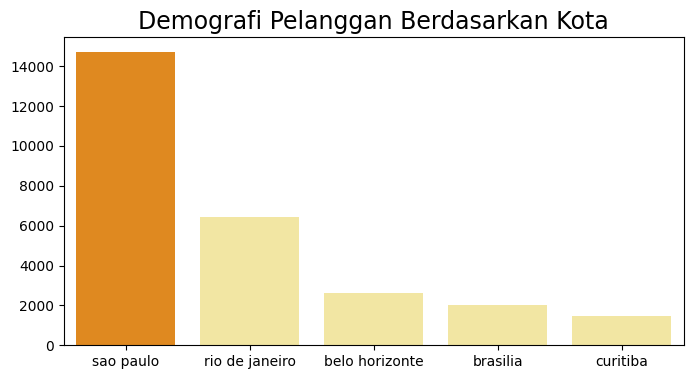

In [118]:
colors = ["#FF8C00", "#FFEF96", "#FFEF96", "#FFEF96", "#FFEF96"]

plt.figure(figsize=(8, 4))

sns.barplot(
    x="customer_city",
    y="customer_count",
    data=by_city_df.sort_values(by="customer_count", ascending=False).head(5),
    palette=colors
)

plt.title("Demografi Pelanggan Berdasarkan Kota", loc="center", fontsize=17)
plt.ylabel(None)
plt.xlabel(None)
plt.tick_params(axis="x", labelsize=10)
plt.show()

**Insight:** Berdasarkan gambar visualisasi data di atas, dapat disimpulkan bahwa kebanyakan pelanggan berasal dari kota Sao Paolo.

#### Demografi Pelanggan Berdasarkan Negara Bagian

In [119]:
by_state_df = all_dataset_df.groupby(by="customer_state").customer_id.nunique().reset_index()
by_state_df.rename(columns={"customer_id": "customer_count"}, inplace=True)

Pada kode di atas, saya membuat DataFrame baru bernama `by_state_df` untuk mengelompokkan informasi tentang demografi pelanggan berdasarkan negara bagiannya. Selanjutnya, dataframe di atas akan dielaborasi penyajian informasinya dengan visualisasi data menggunakan library Matplotlib dan Seaborn untuk menghasilkan sebuah bar chart. Berikut adalah kode untuk menjalankan langkahnya.

<ipython-input-120-4b58313bf1b4>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


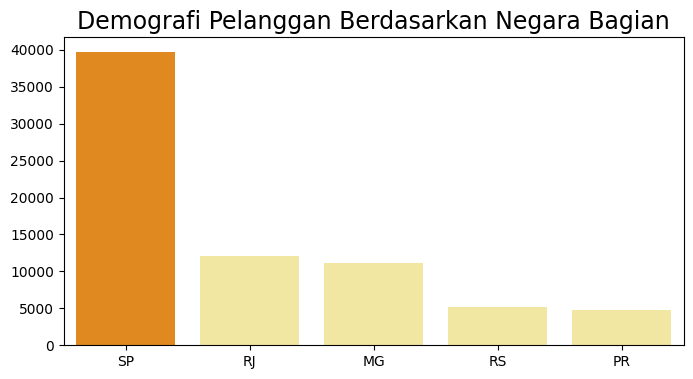

In [120]:
colors = ["#FF8C00", "#FFEF96", "#FFEF96", "#FFEF96", "#FFEF96"]

plt.figure(figsize=(8, 4))

sns.barplot(
    x="customer_state",
    y="customer_count",
    data=by_state_df.sort_values(by="customer_count", ascending=False).head(5),
    palette=colors
)

plt.title("Demografi Pelanggan Berdasarkan Negara Bagian", loc="center", fontsize=17)
plt.ylabel(None)
plt.xlabel(None)
plt.tick_params(axis="x", labelsize=10)
plt.show()

**Insight:** Berdasarkan gambar visualisasi data di atas, dapat disimpulkan bahwa kebanyakan pelanggan berasal dari negara bagian SP.

### Pertanyaan 2: Bagaimana kinerja penjualan atau pendapatan dalam beberapa bulan terakhir?

Untuk menjawab pertanyaan kedua, saya akan membuat DataFrame baru yang akan digunakan untuk menampung informasi terkait jumlah pesanan dan jumlah pendapatan yang diperoleh setiap bulan. Oleh sebab itu, diperlukan perubahan frekuensi data dari yang awalnya berformat harian menjadi bulanan.

Dalam hal ini saya akan menggunakan method `resample()`. Dengan menggunakan method ini, saya akan mengubah frekuensi atau meresample DataFrame yang memuat komponen time series. Method ini digunakan bersama parameter `rule` (mengatur target konversi) dan `on` (nama kolom bertipe datetime yang ingin diubah frekuensinya).

Berikut adalah kode untuk menjalankannya.

In [121]:
monthly_orders_df = all_dataset_df.resample(rule="M", on="order_delivered_customer_date").agg({
    "order_id": "nunique",
    "price": "sum"
})
monthly_orders_df.index = monthly_orders_df.index.strftime("%Y-%m")
monthly_orders_df = monthly_orders_df.reset_index()
monthly_orders_df.rename(columns={
    "order_id": "order_count",
    "price": "total_revenue"
}, inplace=True)

<ipython-input-121-26d1466132a9>:1: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_orders_df = all_dataset_df.resample(rule="M", on="order_delivered_customer_date").agg({


Hasil pembuatan DataFrame di atas dapat dilihat dengan kode berikut.

In [122]:
monthly_orders_df.head()

,order_delivered_customer_date,order_count,total_revenue
0,2016-10,205,30283.45
1,2016-11,58,10805.48
2,2016-12,3,581.89
3,2017-01,278,36743.04
4,2017-02,1297,199414.58


Sebelum menyajikan informasi dalam bentuk visualisasi data, terlebih dahulu saya akan memfilter kolom "order_delivered_customer_date" agar hanya mengambil data satu tahun belakangan saja (tahun 2018) sesuai dengan pertanyaan bisnis yang telah dirumuskan. Berikut adalah kodenya.

In [123]:
latest_year_df = all_dataset_df[all_dataset_df['order_delivered_customer_date'].dt.year == 2018]

Selanjutnya, saya akan mulai mengelaborasi penyajian informasinya dengan visualisasi data menggunakan library Matplotlib untuk menghasilkan sebuah line chart. Berikut adalah kode untuk menjalankan langkahnya.

<ipython-input-124-6ad2cb3d8b77>:1: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_orders_df = latest_year_df.resample(rule="M", on="order_delivered_customer_date").agg({


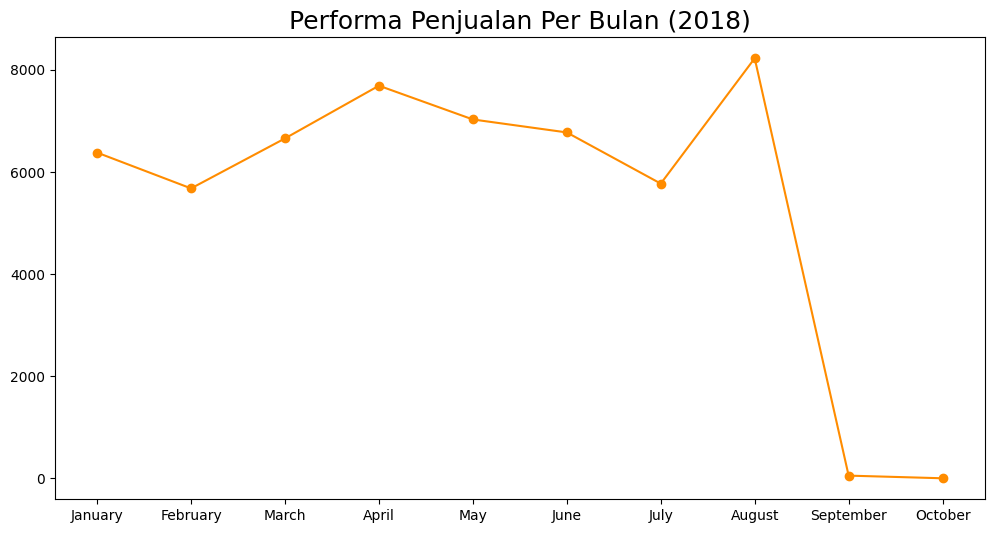

In [124]:
monthly_orders_df = latest_year_df.resample(rule="M", on="order_delivered_customer_date").agg({
       "order_id": "nunique",
       "price": "sum"
})
monthly_orders_df.index = monthly_orders_df.index.strftime("%B")
monthly_orders_df = monthly_orders_df.reset_index()
monthly_orders_df.rename(columns={
    "order_id": "order_count",
    "price": "total_revenue"
}, inplace=True)

plt.figure(figsize=(12, 6))
plt.plot(monthly_orders_df["order_delivered_customer_date"], monthly_orders_df["order_count"], marker="o", color="#FF8C00")
plt.title("Performa Penjualan Per Bulan (2018)", loc="center", fontsize=18)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

Berdasarkan gambar visualisasi data di atas, dapat disimpulkan bahwa kinerja penjualan paling bagus terjadi pada bulan Agustus. Sementara itu, terdapat penurunan kinerja penjualan yang sangat signifikan pada bulan September dan Oktober.

Terjadinya penurunan kinerja penjualan tersebut tentu akan berdampak pada turunnya jumlah pendapatan yang diperoleh. Untuk memastikan hal tersebut, saya akan membuat line chart lagi menggunakan kode berikut!

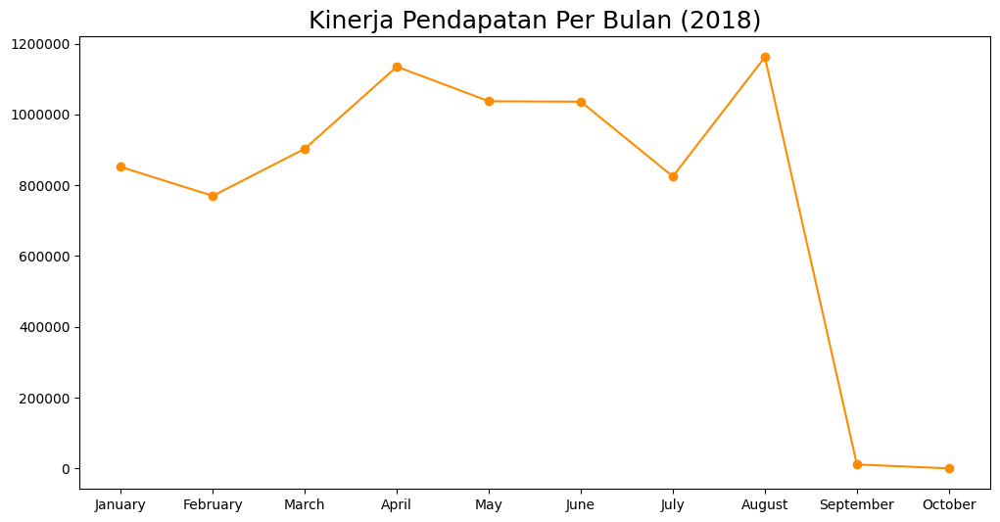

In [125]:
plt.figure(figsize=(12, 6))
plt.plot(monthly_orders_df["order_delivered_customer_date"], monthly_orders_df["total_revenue"], marker="o", color="#FF8C00")
plt.title("Kinerja Pendapatan Per Bulan (2018)", loc="center", fontsize=18)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.ticklabel_format(style='plain', axis='y')
plt.show()

Berdasarkan gambar visualisasi data di atas, dapat terlihat bahwa penurunan kinerja penjualan yang sangat signifikan pada bulan September dan Oktober memberikan dampak pada terjadinya penurunan jumlah pendapatan di kedua bulan tersebut.

Pada dasarnya terjadinya penurunan kinerja penjualan dan jumlah pendapatan harus dicari tahu penyebabnya berdasarkan pertimbangan banyak faktor seperti persaingan dengan kompetitor, proses marketing yang tidak tepat sasaran dan lain sebagainya. Namun, untuk kasus proyek ini, saya tidak memiliki cukup informasi untuk mencari tahu lebih lanjut tentang hal tersebut.

### Pertanyaan 3: Apa katagori produk yang paling banyak dan paling sedikit terjual?

Pertanyaan bisnis terakhir adalah mengenai katagori produk dengan penjualan paling banyak dan paling sedikit. Untuk menjawab pertanyaan ini, saya akan membuat DataFrame baru yang menampung informasi tentang jumlah penjualan seluruh katagori produk. Berikut adalah kode untuk menjalankan.

In [126]:
sum_of_product_category_df = all_dataset_df.groupby(by="product_category_name_english").agg({
    "order_id": "count"
}).rename(columns={"order_id": "total_sales"}). sort_values(by="total_sales", ascending=False)

Hasil pembuatan DataFrame di atas dapat dilihat dengan kode berikut.

In [127]:
sum_of_product_category_df.head()

,total_sales
product_category_name_english,
bed_bath_table,11684
health_beauty,9749
sports_leisure,8734
furniture_decor,8554
computers_accessories,7926


Selanjutnya, saya akan mulai mengelaborasi penyajian informasinya dengan visualisasi data menggunakan library Matplotlib dan Seaborn untuk menghasilkan sebuah bar chart. Informasi tersebut akan disajikan dalam dua bentuk visualisasi data dalam satu gambar visual agar mempermudah mengidentifikasi katagori produk dengan performa terbaik dan terburuk. Dalam hal ini saya akan menggunakan function `subplot()`. Berikut adalah kode untuk membuatnya.

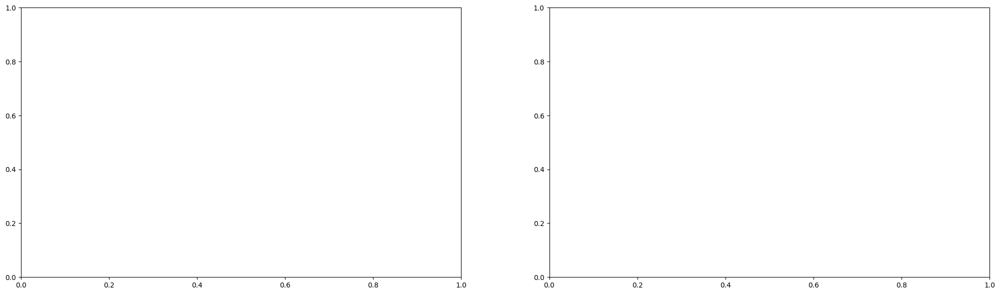

In [128]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(25, 7))

Kode tersebut telah berhasil menghasilkan kanvas kosong dengan objek berupa `fig` dan `ax` sebagaimana yang terlihat dalam output di atas. Berikutnya, kanvas kosong tersebut akan diisi dengan informasi katagori produk yang paling banyak dan paling sedikit dipesan dalam bentuk visualisasi bar chart. Berikut adalah kodenya.

<ipython-input-129-1b900e5056a7>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="total_sales", y="product_category_name_english", data=sum_of_product_category_df.head(5), palette=colors, ax=ax[0])
<ipython-input-129-1b900e5056a7>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="total_sales", y="product_category_name_english", data=sum_of_product_category_df.sort_values(by="total_sales", ascending=True).head(5), palette=colors, ax=ax[1])


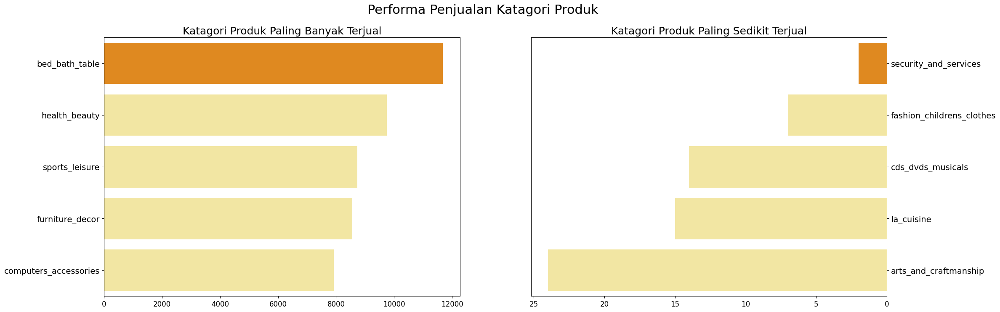

In [129]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(24, 8))

colors = ["#FF8C00", "#FFEF96", "#FFEF96", "#FFEF96", "#FFEF96"]

sns.barplot(x="total_sales", y="product_category_name_english", data=sum_of_product_category_df.head(5), palette=colors, ax=ax[0])
ax[0].set_ylabel(None)
ax[0].set_xlabel(None)
ax[0].set_title("Katagori Produk Paling Banyak Terjual", loc="center", fontsize=18)
ax[0].tick_params(axis="y", labelsize=14)
ax[0].tick_params(axis="x", labelsize=12)

sns.barplot(x="total_sales", y="product_category_name_english", data=sum_of_product_category_df.sort_values(by="total_sales", ascending=True).head(5), palette=colors, ax=ax[1])
ax[1].set_ylabel(None)
ax[1].set_xlabel(None)
ax[1].invert_xaxis()
ax[1].yaxis.set_label_position("right")
ax[1].yaxis.tick_right()
ax[1].set_title("Katagori Produk Paling Sedikit Terjual", loc="center", fontsize=18)
ax[1].tick_params(axis="y", labelsize=14)
ax[1].tick_params(axis="x", labelsize=12)

plt.suptitle("Performa Penjualan Katagori Produk", fontsize=22)
plt.show()

**Insight**

Berdasarkan dua gambar visualisasi data di atas, dapat disimpulkan dua hal:
- Bed, Bath and Table (tempat tidur, peralatan kamar mandi atau toilet dan meja) merupakan katagori produk paling laris
- Security and Services (keamanan dan servis) merupakan katagori produk paling sedikit dijual

## Analisis Lanjutan: RFM Analysis

Langkah analisis lanjutan ini merupakan langkah untuk memperkaya wawasan tentang data. Dalam hal ini, teknik yang digunakan untuk melakukan analisis lanjutan adalah RFM Analysis. RFM Analysis merupakan teknik analisis lanjutan yang mensegmentasi pelanggan ke dalam tiga parameter yaitu:
- Recency: Kapan terakhir pelanggan melakukan transaksi.
- Frequency: Seberapa sering pelanggan melakukan transaksi.
- Monetary: Berapa pendapatan yang berasal dari pelanggan tersebut.

Berdasarkan ketiga parameter tersebut, akan dapat diketahui pelanggan mana yang memiliki high value.

Langkah pertama untuk memulai analisis lanjutan dengan teknik RFM Analysis ini diawali dengan pembuatan sebuah DataFrame baru yang akan digunakan untuk menampung informasi yang berhubungan dengan ketiga parameter tersebut. Berikut adalah kode pembuatannya.

In [130]:
rfm_analysis_df = all_dataset_df.groupby(by="customer_id", as_index=False).agg({
    "order_delivered_customer_date": "max",
    "order_id": "nunique",
    "price": "sum"
}).rename(columns={
    "order_delivered_customer_date": "recency_date",
    "order_id": "frequency",
    "price": "monetary"
})

rfm_analysis_df.columns = ["customer_id", "recency_date", "frequency", "monetary"]

rfm_analysis_df["recency_date"] = rfm_analysis_df["recency_date"].dt.date
recent_date = all_dataset_df["order_delivered_customer_date"].dt.date.max()
rfm_analysis_df["recency"] = rfm_analysis_df["recency_date"].apply(lambda x: (recent_date - x).days)

rfm_analysis_df.drop(columns="recency_date", axis=1, inplace=True)
rfm_analysis_df.head()

,customer_id,frequency,monetary,recency
0,00012a2ce6f8dcda20d059ce98491703,1,89.80,323
1,000161a058600d5901f007fab4c27140,1,54.90,449
2,0001fd6190edaaf884bcaf3d49edf079,1,179.99,590
3,0002414f95344307404f0ace7a26f1d5,1,149.90,399
4,000379cdec625522490c315e70c7a9fb,1,93.00,187


<ipython-input-131-b2bd721267e5>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y="recency", x="customer_id", data=rfm_analysis_df.sort_values(by="recency", ascending=True).head(5), palette=colors, ax=ax[0])
<ipython-input-131-b2bd721267e5>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y="frequency", x="customer_id", data=rfm_analysis_df.sort_values(by="frequency", ascending=False).head(5), palette=colors, ax=ax[1])
<ipython-input-131-b2bd721267e5>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y="monetary", x="customer_id", data=rf

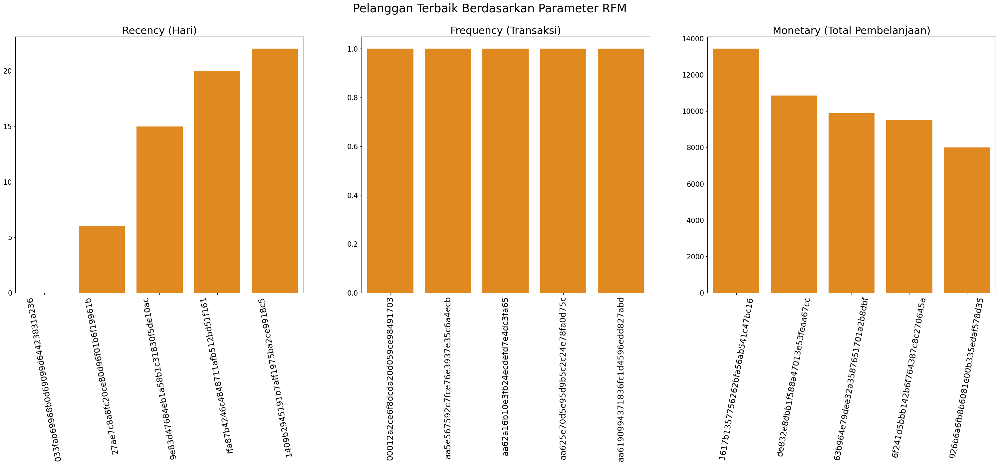

In [131]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(38, 10))

colors = ["#FF8C00", "#FF8C00", "#FF8C00", "#FF8C00", "#FF8C00"]

sns.barplot(y="recency", x="customer_id", data=rfm_analysis_df.sort_values(by="recency", ascending=True).head(5), palette=colors, ax=ax[0])
ax[0].set_ylabel(None)
ax[0].set_xlabel(None)
ax[0].set_title("Recency (Hari)", loc="center", fontsize=22)
ax[0].tick_params(axis='x', rotation=100, labelsize=18)
ax[0].tick_params(axis='y', labelsize=15)

sns.barplot(y="frequency", x="customer_id", data=rfm_analysis_df.sort_values(by="frequency", ascending=False).head(5), palette=colors, ax=ax[1])
ax[1].set_ylabel(None)
ax[1].set_xlabel(None)
ax[1].set_title("Frequency (Transaksi)", loc="center", fontsize=22)
ax[1].tick_params(axis='x', rotation=90, labelsize=18)
ax[1].tick_params(axis='y', labelsize=15)

sns.barplot(y="monetary", x="customer_id", data=rfm_analysis_df.sort_values(by="monetary", ascending=False).head(5), palette=colors, ax=ax[2])
ax[2].set_ylabel(None)
ax[2].set_xlabel(None)
ax[2].set_title("Monetary (Total Pembelanjaan)", loc="center", fontsize=22)
ax[2].tick_params(axis='x', rotation=80, labelsize=18)
ax[2].tick_params(axis='y', labelsize=15)

plt.suptitle("Pelanggan Terbaik Berdasarkan Parameter RFM", fontsize=25)
plt.show()

**Insight**


---


- By Recency (days)

Grafik tersebut menunjukkan 5 pelanggan yang paling baru melakukan transaksi. Kita bisa melihat ID pelanggan (customer_id) pada sumbu X dan nilai recency (jumlah hari sejak transaksi terakhir) pada sumbu Y. Semakin rendah nilai recency (semakin ke kiri pada grafik), semakin baru pelanggan tersebut melakukan transaksi.

Pelanggan dengan ID "033fab69968b0d69099d64423831a236" merupakan pelanggan yang memiliki nilai recency terendah. Hal tersebut menunjukkan bahwa pelanggan ini adalah pelanggan yang paling baru melakukan transaksi di antara 4 pelanggan dengan nilai recency terendah lainnya.

- By Frequency

Grafik tersebut menunjukkan 5 pelanggan yang paling sering melakukan transaksi. Kita bisa melihat ID pelanggan pada sumbu X dan nilai frequency (jumlah transaksi) pada sumbu Y. Semakin tinggi nilai frequency maka semakin sering pelanggan tersebut melakukan transaksi.

Berdasarkan gambar visualisasi data tersebut dapat disimpulkan bahwa semua pelanggan rata-rata hanya memesan satu kali saja.

- By Monetary

Grafik tersebut menunjukkan 5 pelanggan yang memberikan pendapatan paling besar. Kita bisa melihat ID pelanggan pada sumbu X dan nilai monetary (total uang yang dibelanjakan) pada sumbu Y. Semakin tinggi nilai monetary maka semakin besar pendapatan yang dihasilkan dari pelanggan tersebut.

Pelanggan dengan ID "1617b1357756262bfa56ab541c47bc16" merupakan pelanggan yang memiliki nilai monetary tertinggi. Hal tersebut menunjukkan bahwa pelanggan ini adalah pelanggan yang paling banyak menghabiskan uang di antara 4 pelanggan dengan nilai monetary tertinggi lainnya.

## Conclusion

- Conclution Pertanyaan 1

Berdasarkan hasil eksplorasi dan visualisasi data di atas, dapat disimpulkan bahwa terdapat banyak sekali kota dengan jumlah pelanggan paling sedikit yaitu hanya 1 pelanggan seperti kota Lagoao, Pedro Gomes, Caraibas dan lain-lain. Adapun jumlah pelanggan terbanyak berasal dari kota Sao Paulo yaitu 15.540 pelanggan.

Sedangkan negara bagian RR memiliki jumlah pelanggan paling sedikit yaitu hanya 46 pelanggan, adapun negara bagian SP merupakan negara bagian yang memiliki pelanggan terbanyak yaitu 41.746 pelanggan.

- Conclution Pertanyaan 2

Berdasarkan hasil eksplorasi dan visualisasi data di atas, dapat disimpulkan bahwa kinerja penjualan paling bagus terjadi pada bulan Agustus. Sementara itu, terdapat penurunan kinerja penjualan yang sangat signifikan pada bulan September dan Oktober. Terjadinya penurunan kinerja penjualan tersebut tentu akan berdampak pada turunnya jumlah pendapatan yang diperoleh. Pada gambar visualisasi data di atas, dapat terlihat bahwa penurunan kinerja penjualan yang sangat signifikan pada bulan September dan Oktober memberikan dampak pada terjadinya penurunan jumlah pendapatan di kedua bulan tersebut.

- Conclution Pertanyaan 3

Berdasarkan hasil eksplorasi dan visualisasi data di atas, dapat disimpulkan bahwa katagori produk dengan penjualan paling sedikit adalah security and services (keamanan dan servis) dengan hanya terdapat 2 penjualan saja, sedangkan katagori produk dengan penjualan paling banyak adalah bed, bath and table (tempat tidur, peralatan kamar mandi atau toilet dan meja) dengan jumlah penjualan sebanyak 11.115.

- Conclution RFM Analysis

1) By Recency (days)

Pelanggan dengan ID "033fab69968b0d69099d64423831a236" merupakan pelanggan yang memiliki nilai recency terendah. Hal tersebut menunjukkan bahwa pelanggan ini adalah pelanggan yang paling baru melakukan transaksi di antara 4 pelanggan dengan nilai recency terendah lainnya.

2) By Frequency

Berdasarkan gambar visualisasi data di atas dapat disimpulkan bahwa semua pelanggan rata-rata hanya memesan satu kali saja.

3) By Monetary

Pelanggan dengan ID "1617b1357756262bfa56ab541c47bc16" merupakan pelanggan yang memiliki nilai monetary tertinggi. Hal tersebut menunjukkan bahwa pelanggan ini adalah pelanggan yang paling banyak menghabiskan uang di antara 4 pelanggan dengan nilai monetary tertinggi lainnya.
